In [13]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from error import error_fun
import Hull_White_plot_General_q as hwp
from slope_calc import slope
plt.rcParams.update({'font.family':'cmr10'})
plt.rcParams['font.size']=24
plt.rc('axes', unicode_minus=False)


In [14]:
renewable = ["nee","tsla","fslr","run","cwen","plug"]
fossil = ["xom","cvx","cop","btu","arch"]
renewable_pre = ["nee_pre","tsla_pre","fslr_pre","run_pre","cwen_pre","plug_pre"]
renewable_post = ["nee_post","tsla_post","fslr_post","run_post","cwen_post","plug_post"]
fossil_pre = ["xom_pre","cvx_pre","cop_pre","btu_pre","arch_pre"]
fossil_post = ["xom_post","cvx_post","cop_post","btu_post","arch_post"]

market = ["djia","ndaq","rut","gspc"]
market_pre = ["djia_pre","ndaq_pre","rut_pre","gspc_pre"]
market_post = ["djia_post","ndaq_post","rut_post","gspc_post"]

test = ["plug"]

In [150]:
def analyze_q(ticker):
    if ticker.endswith("pre"):
        capital_ticker = ticker[:-4].upper() + " Pre-March 11, 2020,"
    elif ticker.endswith("post"):
        capital_ticker = ticker[:-5].upper() + " Post-March 11, 2020,"
    else:
        capital_ticker = ticker.upper()
    stock_data = pd.read_csv("./data_to_Mar_6/"+ticker+".csv")
    close_prices = stock_data['Close'].values.tolist()
    possible_q = np.arange(0.01,0.99,step=0.01)
    weekly_q = []
    for week in range(int(len(close_prices)/5)-1):    
        first_day_of_range = 5 * week
        last_day_of_range = 5 * week + 10
        q_errors = []
        for q in possible_q:
            test = error_fun(q,ticker,close_prices[first_day_of_range:last_day_of_range])
            q_errors.append([q,test])
        optimal_q = min(q_errors, key = lambda t: t[1])
        weekly_q.append(optimal_q[0])

    fig = plt.figure(figsize=(10,6))

    n, bins, patches = plt.hist(weekly_q, 
    bins= np.arange(0.005,0.995,step=0.01),
    edgecolor="black", 
    # weights=np.ones(len(weekly_q)) / len(weekly_q),
    color='royalblue')
    plt.xlabel("Q Value")
    plt.ylabel("Frequency")
    plt.yticks(np.arange(0,n.max()+1,step=1))
    plt.xticks(np.arange(0, 1, step=0.1))
    plt.xlim(0.005,0.995)
    plt.title(capital_ticker + "\nBinomial Model Optimal Q Values")
    plt.show()

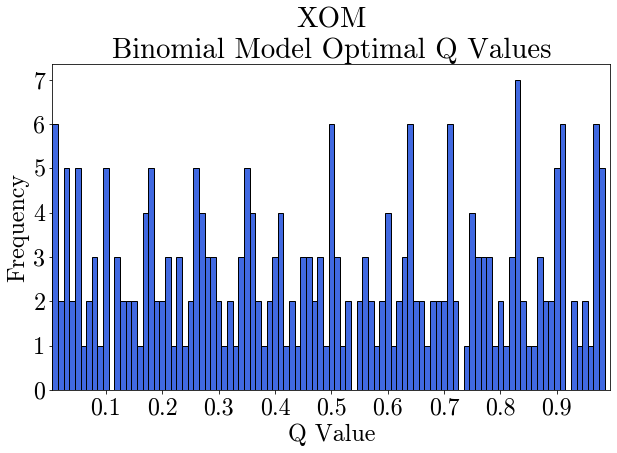

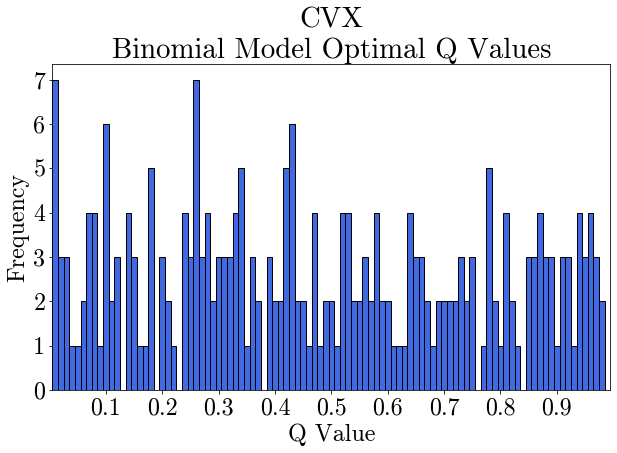

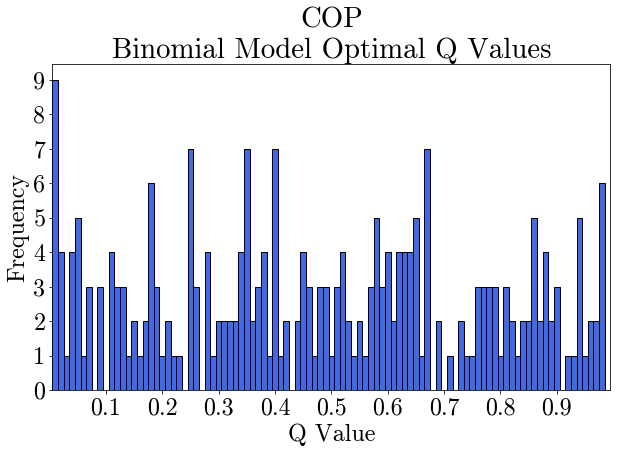

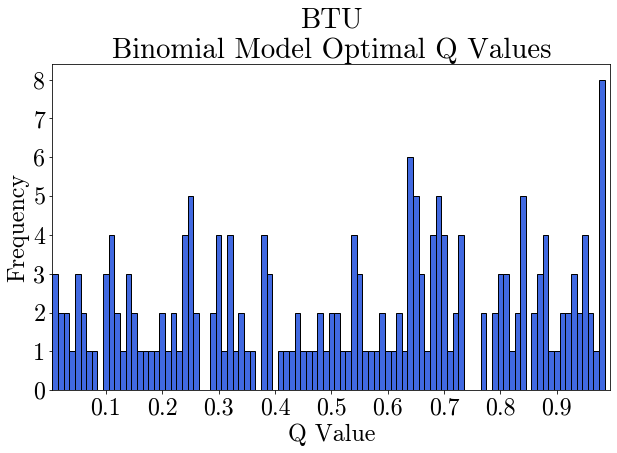

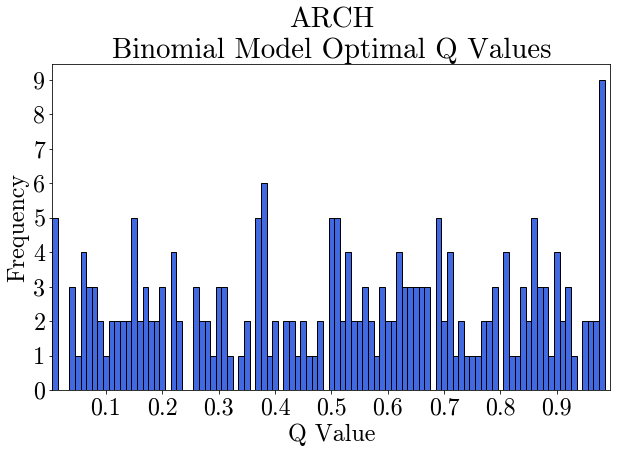

...

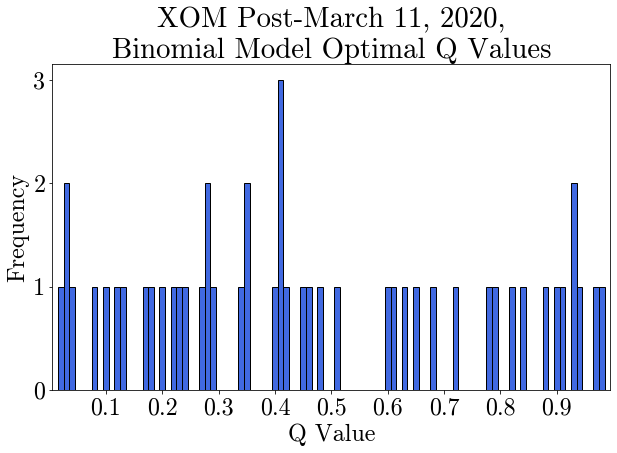

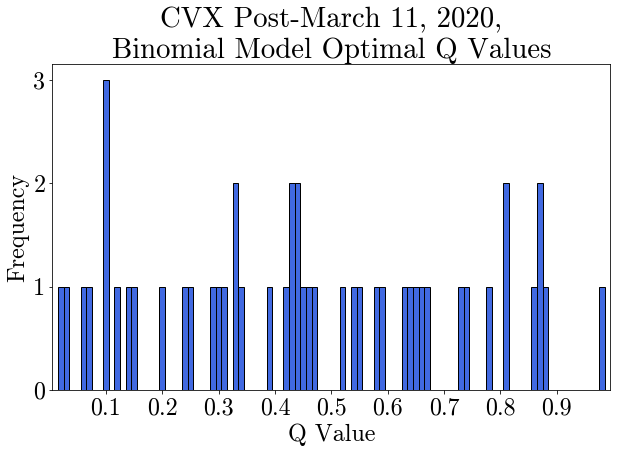

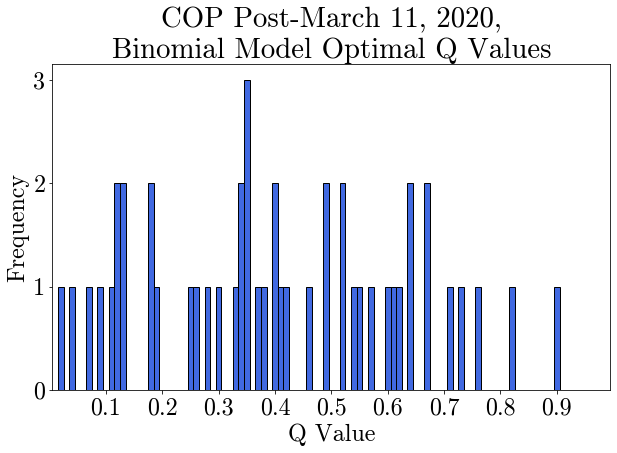

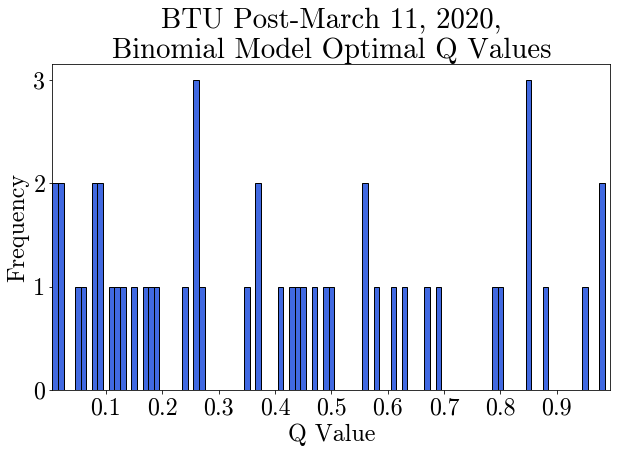

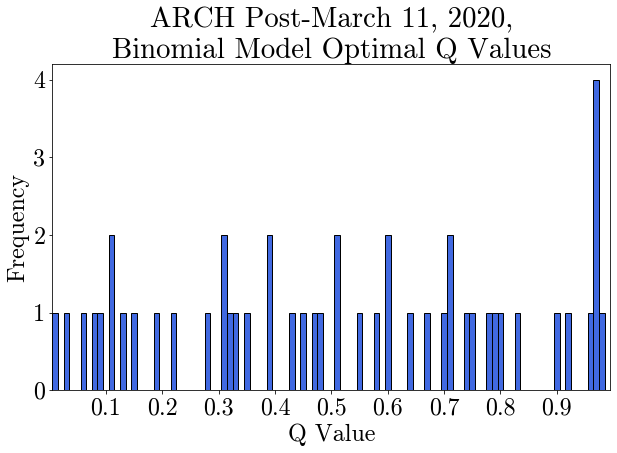

In [151]:
for stock in fossil:
    analyze_q(stock)
for stock in fossil_pre:
    analyze_q(stock)
for stock in fossil_post:
    analyze_q(stock)

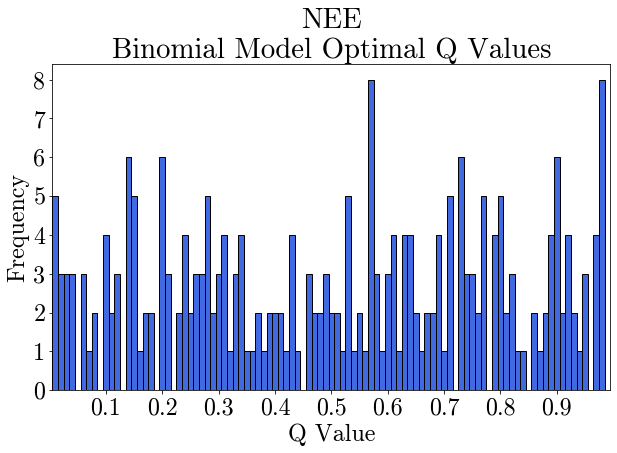

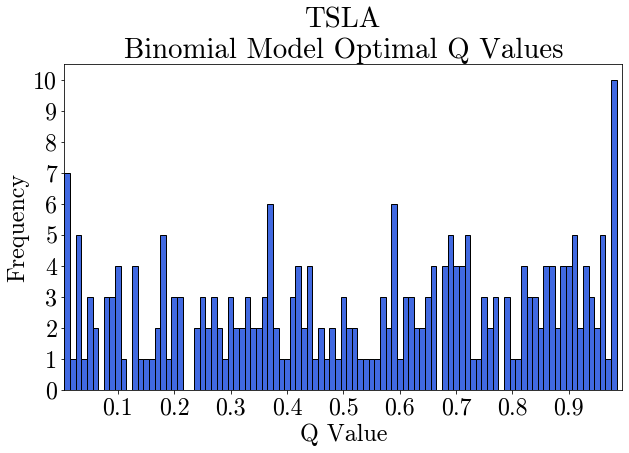

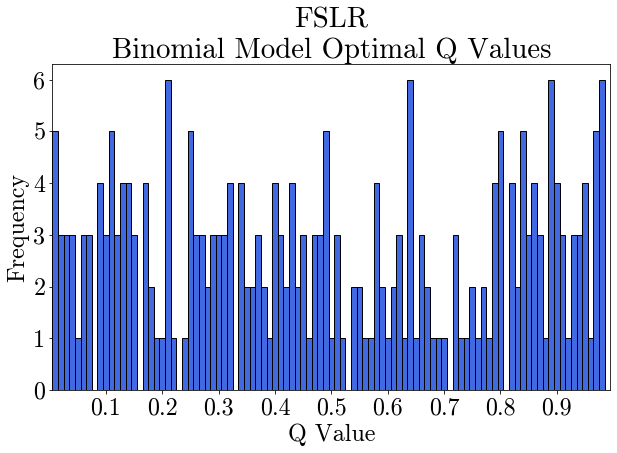

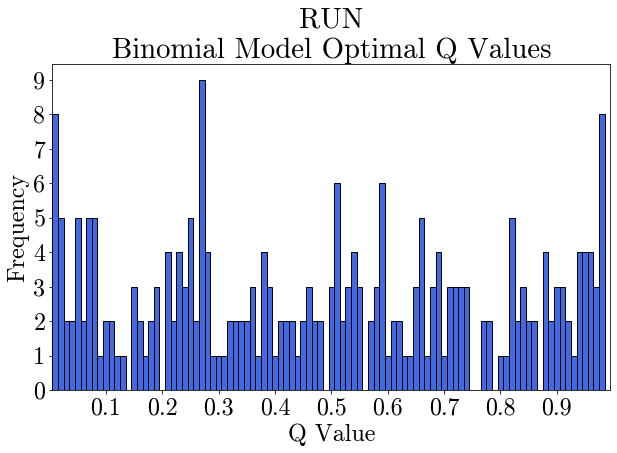

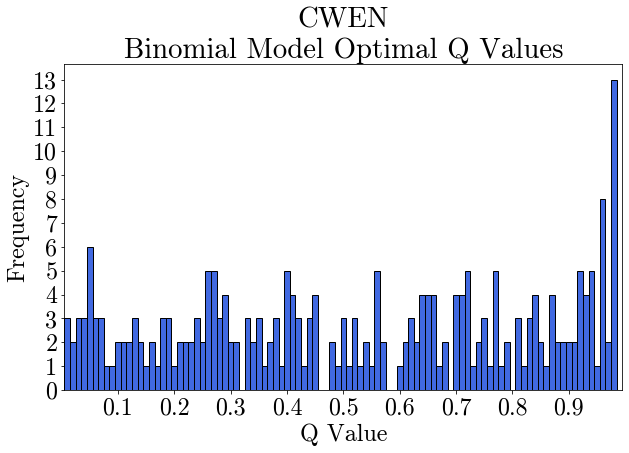

...

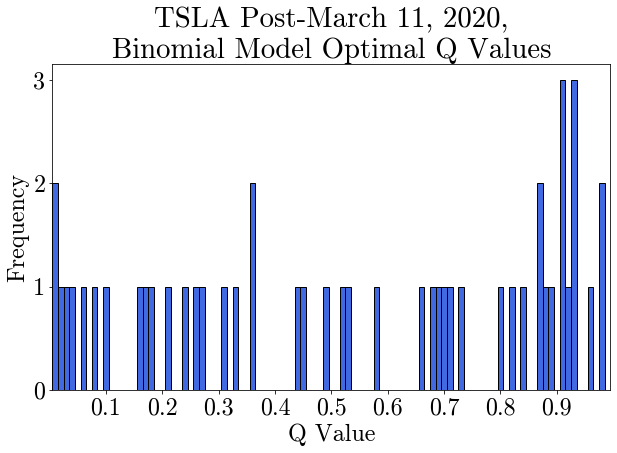

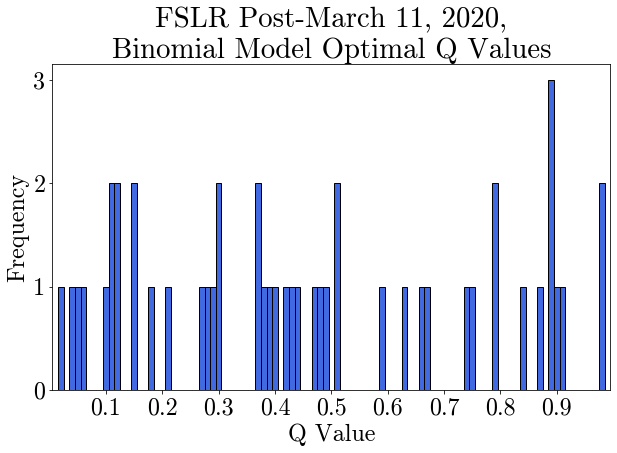

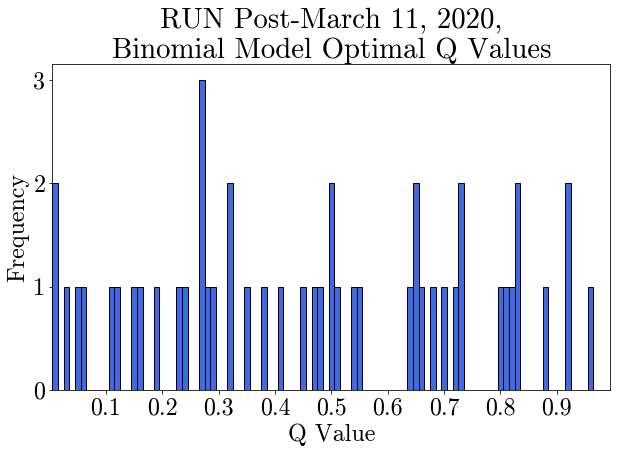

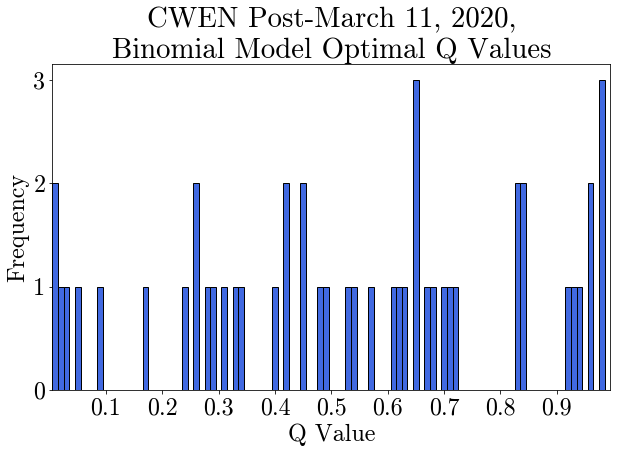

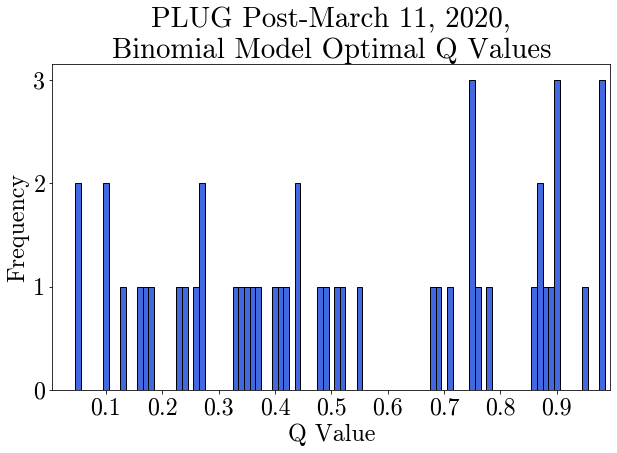

In [153]:
for stock in renewable:
    analyze_q(stock)
for stock in renewable_pre:
    analyze_q(stock)
for stock in renewable_post:
    analyze_q(stock)

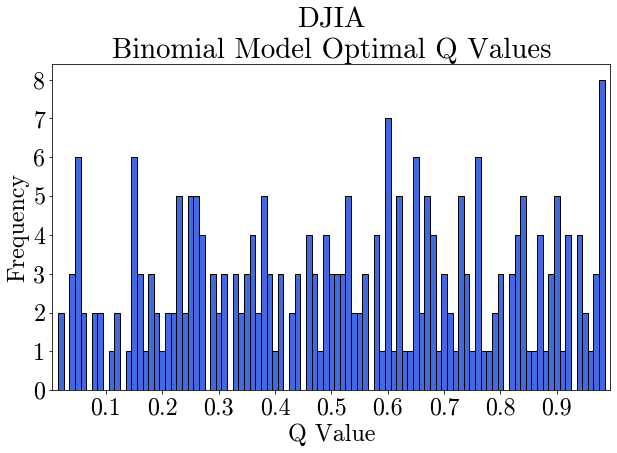

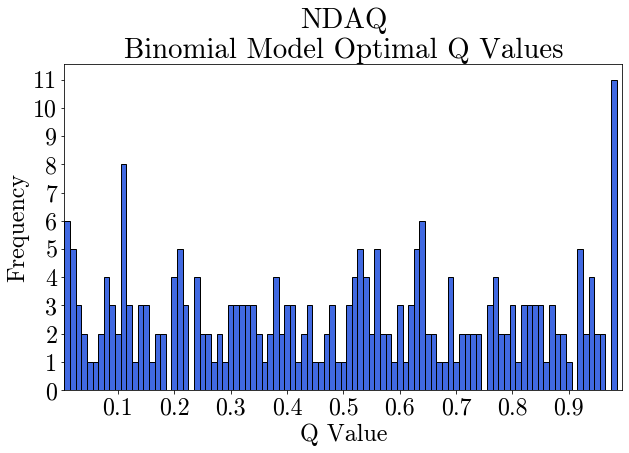

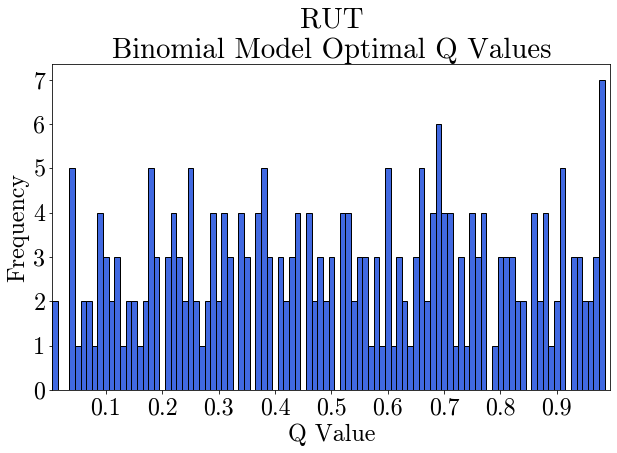

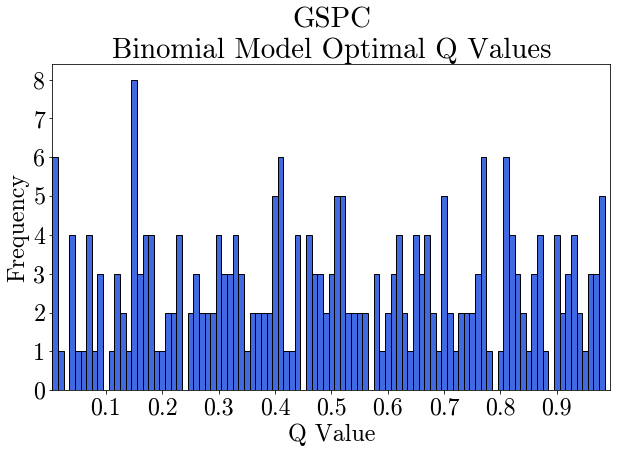

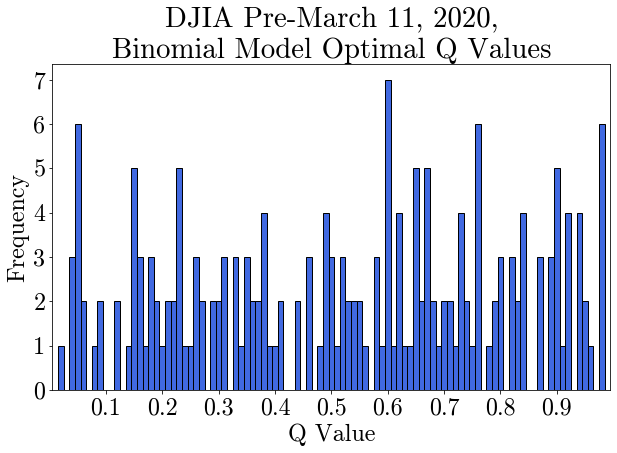

...

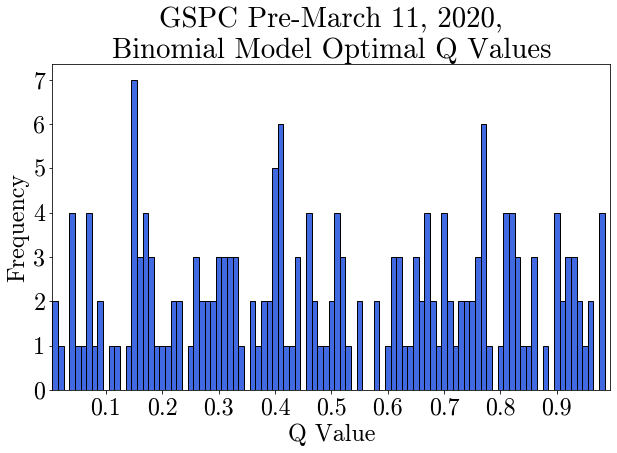

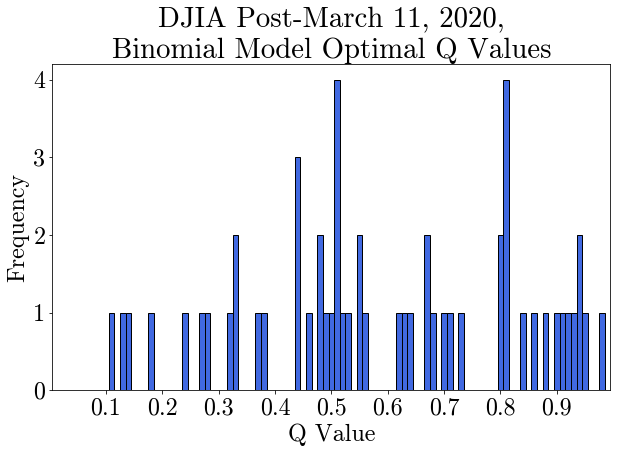

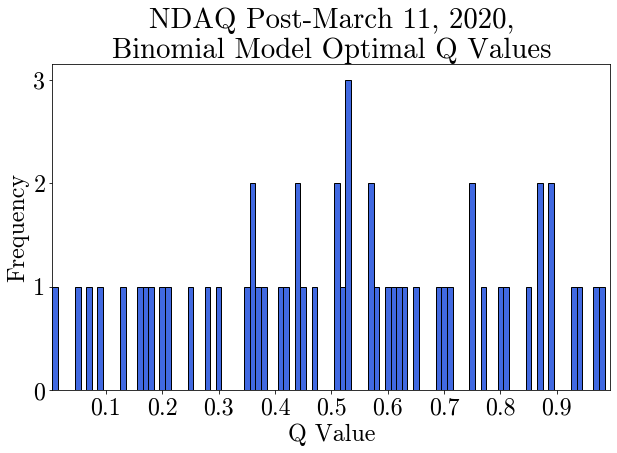

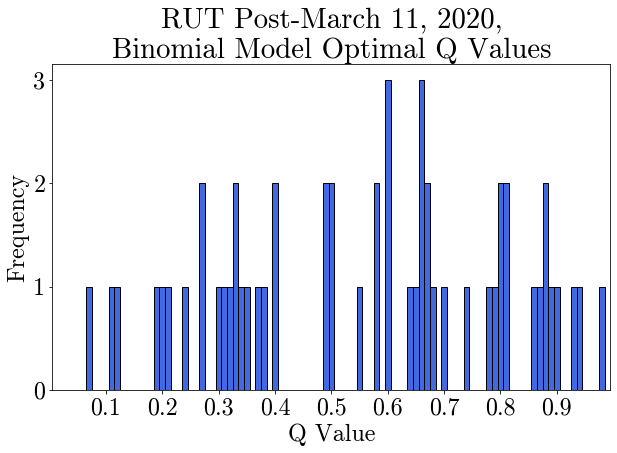

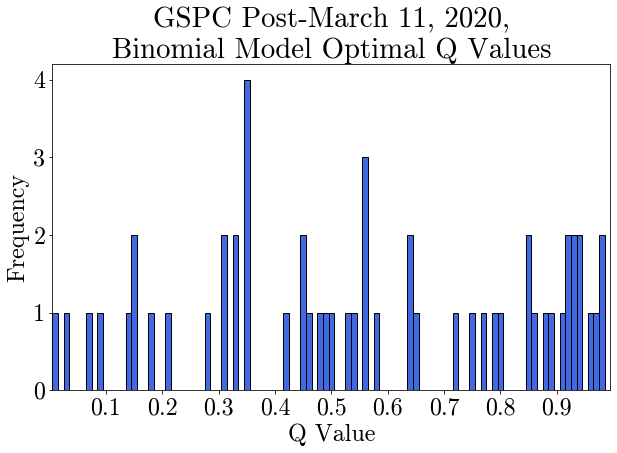

In [154]:
for stock in market:
    analyze_q(stock)
for stock in market_pre:
    analyze_q(stock)
for stock in market_post:
    analyze_q(stock)

In [129]:
def analyze_group_q(plot_name,tickers_list):
    possible_q = np.arange(0.01,0.99,step=0.01)
    weekly_q = []
    for ticker in tickers_list:
        capital_ticker = ticker.upper()
        stock_data = pd.read_csv("./data_to_Mar_6/"+ticker+".csv")
        close_prices = stock_data['Close'].values.tolist()
        for week in range(int(len(close_prices)/5)-1):    
            first_day_of_range = 5 * week
            last_day_of_range = 5 * week + 10
            q_errors = []
            for q in possible_q:
                test = error_fun(q,ticker,close_prices[first_day_of_range:last_day_of_range])
                q_errors.append([q,test])
            optimal_q = min(q_errors, key = lambda t: t[1])
            weekly_q.append(optimal_q[0])

    fig = plt.figure(figsize=(10,6))
    plt.hist(weekly_q, 
    bins=np.arange(0.005,0.995,step=0.01),
    edgecolor="black", 
    #weights=np.ones(len(weekly_q)) / len(weekly_q),
    color='royalblue')
    plt.xlabel("Q Value")
    plt.ylabel("Frequency")
    plt.xticks(np.arange(0, 1, step=0.1))
    plt.xlim(0.005,0.995)
    plt.title(plot_name + "\nBinomial Model Optimal Q Values")
    plt.show()

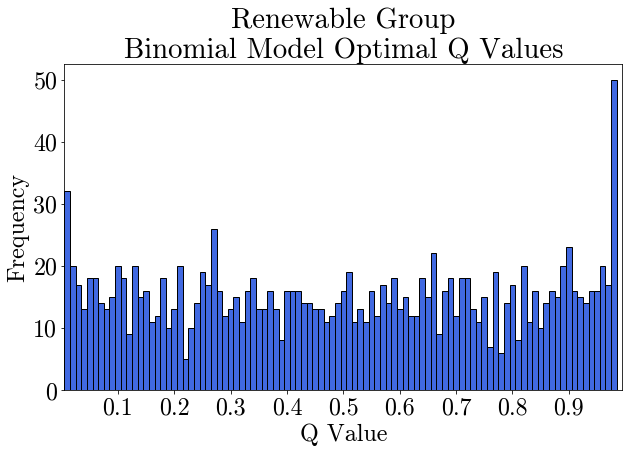

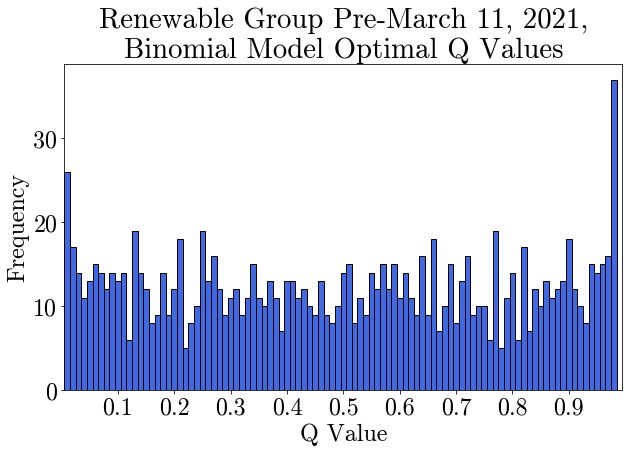

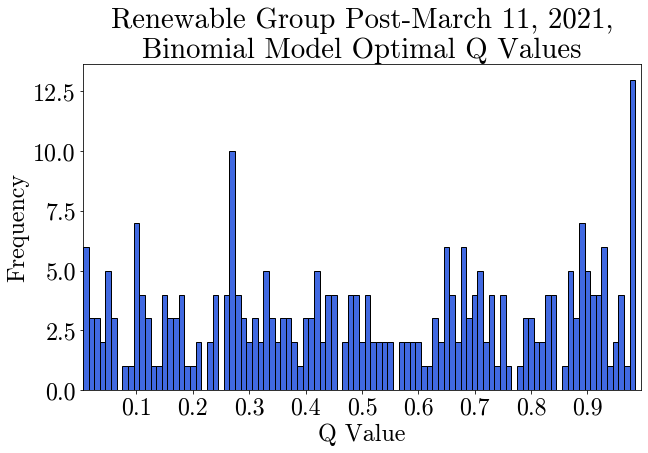

In [133]:
analyze_group_q("Renewable Group",renewable)
analyze_group_q("Renewable Group Pre-March 11, 2021,",renewable_pre)
analyze_group_q("Renewable Group Post-March 11, 2021,",renewable_post)

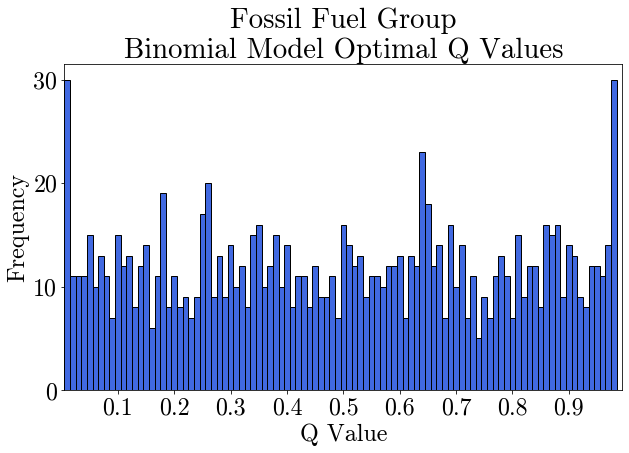

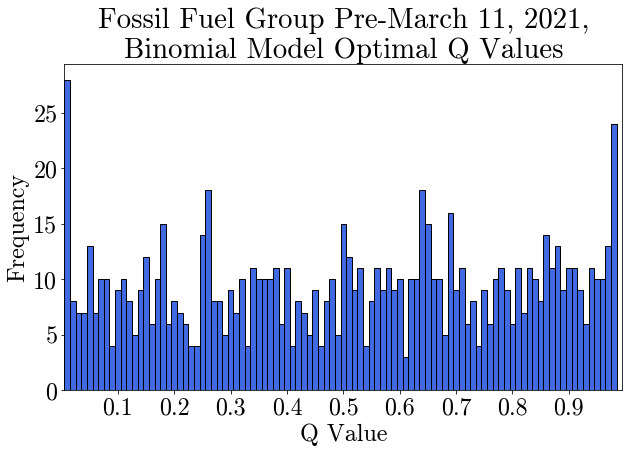

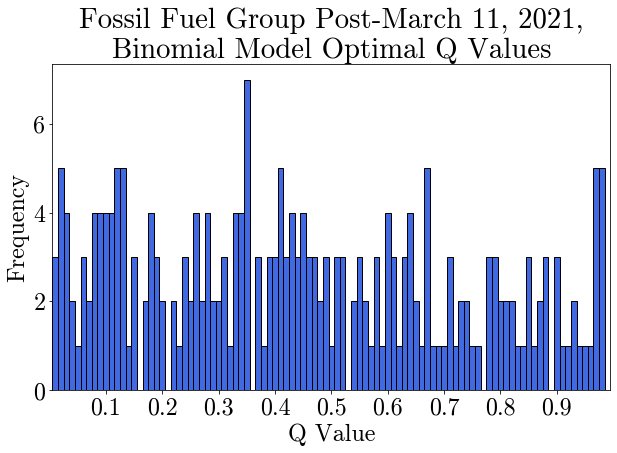

In [134]:
analyze_group_q("Fossil Fuel Group",fossil)
analyze_group_q("Fossil Fuel Group Pre-March 11, 2021,",fossil_pre)
analyze_group_q("Fossil Fuel Group Post-March 11, 2021,",fossil_post)

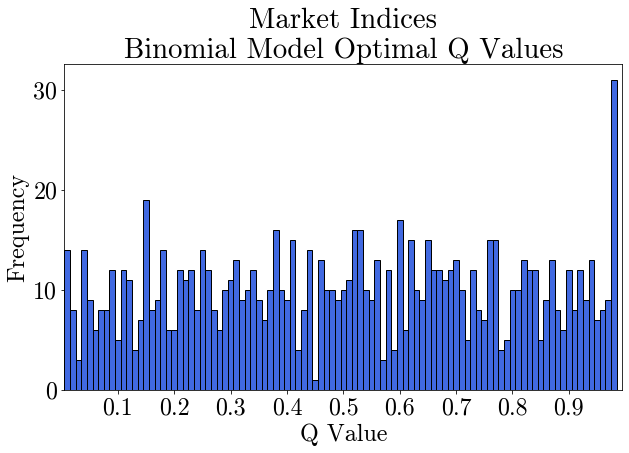

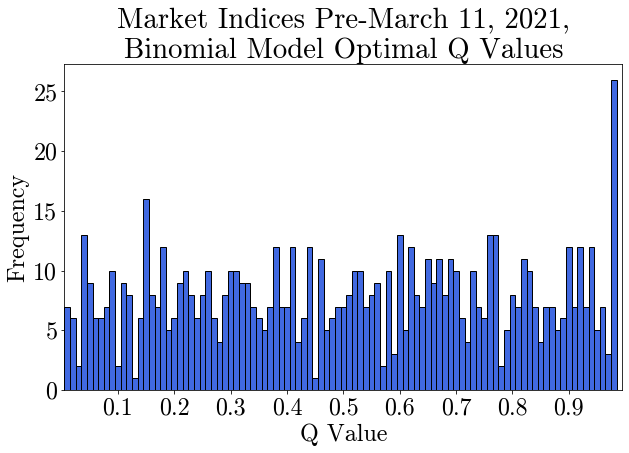

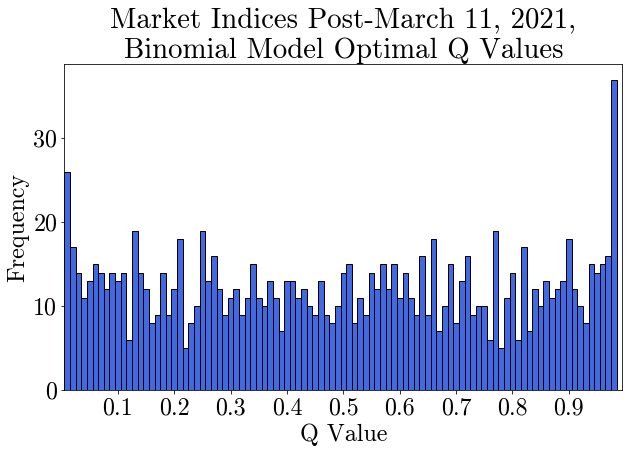

In [135]:
analyze_group_q("Market Indices",market)
analyze_group_q("Market Indices Pre-March 11, 2021,",market_pre)
analyze_group_q("Market Indices Post-March 11, 2021,",renewable_pre)

In [128]:
    possible_q = np.arange(0.01,0.99,step=0.01)
    weekly_q1 = []
    for ticker in renewable:
        capital_ticker = ticker.upper()
        stock_data = pd.read_csv("./data_to_Mar_6/"+ticker+".csv")
        close_prices = stock_data['Close'].values.tolist()
        for week in range(int(len(close_prices)/5)-1):    
            first_day_of_range = 5 * week
            last_day_of_range = 5 * week + 10
            q_errors = []
            for q in possible_q:
                test = error_fun(q,ticker,close_prices[first_day_of_range:last_day_of_range])
                q_errors.append([q,test])
            optimal_q = min(q_errors, key = lambda t: t[1])
            weekly_q1.append(optimal_q[0])

    avg_1 = np.mean(weekly_q1)
    std_1 = np.std(weekly_q1)
    N1 = len(weekly_q1)

    weekly_q2 = []
    for ticker in renewable:
        capital_ticker = ticker.upper()
        stock_data = pd.read_csv("./data_to_Mar_6/"+ticker+".csv")
        close_prices = stock_data['Close'].values.tolist()
        for week in range(int(len(close_prices)/5)-1):    
            first_day_of_range = 5 * week
            last_day_of_range = 5 * week + 10
            q_errors = []
            for q in possible_q:
                test = error_fun(q,ticker,close_prices[first_day_of_range:last_day_of_range])
                q_errors.append([q,test])
            optimal_q = min(q_errors, key = lambda t: t[1])
            weekly_q2.append(optimal_q[0])

    avg_2 = np.mean(weekly_q2)
    std_2 = np.std(weekly_q2)
    N2 = len(weekly_q2)

    std_error = np.sqrt((std_1/N1)+(std_2/N2))

    t_score = np.abs(avg_1-avg_2)/std_error
    deg_free = N1 + N2 - 2

    print("T-score: " + str(t_score))
    print("Degrees of Freedom: " + str(deg_free))


T-score: 0.0
Degrees of Freedom: 2998


In [30]:
def plot_week(ticker,first_day,last_day):
    capital_ticker = ticker.upper()
    stock_data = pd.read_csv("./data_to_Mar_6/"+ticker+".csv")
    close_prices = stock_data['Close'].values.tolist()

    possible_q = np.arange(0.01,0.99,step=0.01)
    q_errors = []
    for q in possible_q:
        test = error_fun(q,ticker,close_prices[first_day:last_day])
        q_errors.append([q,test])
    optimal_q = min(q_errors, key = lambda t: t[1])

    hwp.plot(optimal_q[0],ticker,close_prices[first_day:last_day])

In [21]:
def analyze_m(ticker):
    if ticker.endswith("pre"):
        plot_name = ticker[:-4].upper() + " Pre-March 11, 2020,"
    elif ticker.endswith("post"):
        plot_name = ticker[:-5].upper() + " Post-March 11, 2020,"
    else:
        plot_name = ticker.upper()
    
    stock_data = pd.read_csv("./data_to_Mar_6/"+ticker+".csv")
    close_prices = stock_data['Close'].values.tolist()
    possible_q = np.arange(0.01,0.99,step=0.01)
    weekly_q = []
    weekly_m = []
    overperform = []
    for week in range(int(len(close_prices)/5)-2):    
        first_day_of_range = 5 * week
        last_day_of_range = 5 * week + 10
        q_errors = []
        for q in possible_q:
            test = error_fun(q,ticker,close_prices[first_day_of_range:last_day_of_range])
            q_errors.append([q,test])
        optimal_q = min(q_errors, key = lambda t: t[1])
        weekly_q.append(optimal_q[0])
        m,ev4 = slope(optimal_q[0],ticker,close_prices[first_day_of_range:last_day_of_range])
        weekly_m.append(m)
        if ev4 < close_prices[last_day_of_range]:
            overperform.append(1)
        elif ev4 > close_prices[last_day_of_range]:
            overperform.append(0)
        else:
            print("Trouble in paradise")

    avg_m = np.mean(weekly_m)
    max_m = max(weekly_m)
    min_m = min(weekly_m)
    seventyfifth_per = np.percentile(weekly_m,75)
    twentyfifth_per = np.percentile(weekly_m,25)
    std_m = np.std(weekly_m)
    overperform_percent = np.mean(overperform) * 100
    
    print("\nThe most negative slope for " + plot_name + " is:")
    print(round(min_m,3))

    print("\nThe 25th percentile slope for " + plot_name + " is:")
    print(round(twentyfifth_per,3))

    print("\nThe average slope for " + plot_name + " is:")
    print(round(avg_m,3))
    
    print("\nThe 75th percentile slope for " + plot_name + " is:")
    print(round(seventyfifth_per,3))
    
    print("\nThe most positive slope for " + plot_name + " is:")
    print(round(max_m,3))

    print("\nThe standard deviation of the slopes for " + plot_name + " is:")
    print(round(std_m,3))

    print("\n" + plot_name + " outperformed the one week expectation value " + str(round(overperform_percent)) + "% of the time. \n")


    n, bins, patches = plt.hist(weekly_m, 
    bins=np.arange(-0.1,0.2,0.01),
    edgecolor="black", 
    #weights=np.ones(len(weekly_q)) / len(weekly_q),
    color='green')

    for i in range(len(bins)):
        if bins[i] < -0.0001:
            plt.setp(patches[i], 'facecolor', 'r')

    max_n = max(n)

    plt.annotate('Min M: ' + str(round(min_m,5)) +
                '\n\n25th Percentile M: ' + str(round(twentyfifth_per,5)) +
                '\n\nAverage M: ' + str(round(avg_m,5)) +
                '\n\n75th Percentile M: ' + str(round(seventyfifth_per,5)) +
                '\n\nMax M: ' + str(round(max_m,5))+
                '\n\nStandard Deviation: ' + str(round(std_m,5)), # this is the text
        (0.05, 2/3 * max_n), # this is the point to label
        va='center',
        ha='left',
        c='black',
        fontname='cmr10',
        fontsize=10)

    plt.xticks(np.arange(-0.10,0.20,0.1))
    plt.xlabel("M Value")
    plt.ylabel("Frequency")
    #plt.xticks(np.arange(0, 1, step=0.1))
    plt.title(plot_name + "\nBinomial Model M Values")
    plt.show()

    print("\n\n")


The most negative slope for NEE Pre-March 11, 2020, is:
-0.016

The 25th percentile slope for NEE Pre-March 11, 2020, is:
-0.002

The average slope for NEE Pre-March 11, 2020, is:
0.001

The 75th percentile slope for NEE Pre-March 11, 2020, is:
0.004

The most positive slope for NEE Pre-March 11, 2020, is:
0.01

The standard deviation of the slopes for NEE Pre-March 11, 2020, is:
0.004

NEE Pre-March 11, 2020, outperformed the one week expectation value 47% of the time. 



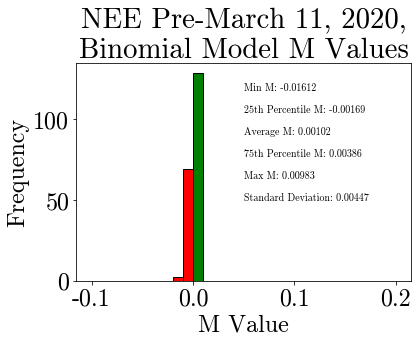

In [22]:
analyze_m("nee_pre")


The most negative slope for NEE is:
-0.023

The 25th percentile slope for NEE is:
-0.002

The average slope for NEE is:
0.001

The 75th percentile slope for NEE is:
0.004

The most positive slope for NEE is:
0.037

The standard deviation of the slopes for NEE is:
0.006

NEE outperformed the one week expectation value 47% of the time. 



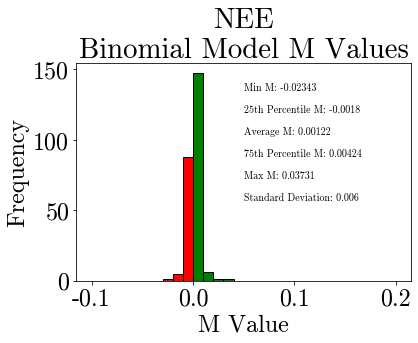





The most negative slope for TSLA is:
-0.079

The 25th percentile slope for TSLA is:
-0.007

The average slope for TSLA is:
0.003

The 75th percentile slope for TSLA is:
0.011

The most positive slope for TSLA is:
0.104

The standard deviation of the slopes for TSLA is:
0.02

TSLA outperformed the one week expectation value 49% of the time. 



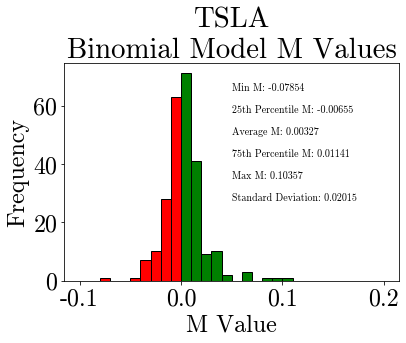





The most negative slope for FSLR is:
-0.04

The 25th percentile slope for FSLR is:
-0.006

The average slope for FSLR is:
0.002

The 75th percentile slope for FSLR is:
0.008

The most positive slope for FSLR is:
0.054

The standard deviation of the slopes for FSLR is:
0.014

FSLR outperformed the one week expectation value 51% of the time. 



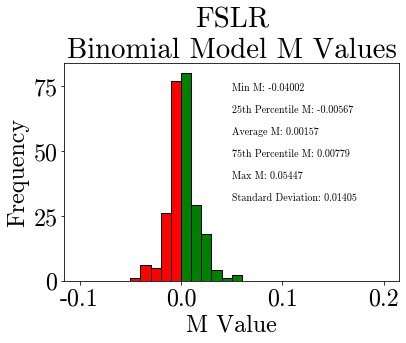





The most negative slope for RUN is:
-0.081

The 25th percentile slope for RUN is:
-0.006

The average slope for RUN is:
0.003

The 75th percentile slope for RUN is:
0.013

The most positive slope for RUN is:
0.093

The standard deviation of the slopes for RUN is:
0.02

RUN outperformed the one week expectation value 49% of the time. 



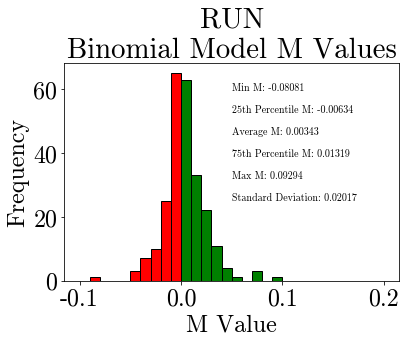





The most negative slope for CWEN is:
-0.033

The 25th percentile slope for CWEN is:
-0.003

The average slope for CWEN is:
0.001

The 75th percentile slope for CWEN is:
0.006

The most positive slope for CWEN is:
0.036

The standard deviation of the slopes for CWEN is:
0.009

CWEN outperformed the one week expectation value 52% of the time. 



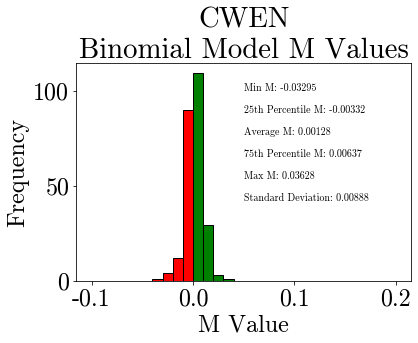





The most negative slope for PLUG is:
-0.064

The 25th percentile slope for PLUG is:
-0.01

The average slope for PLUG is:
0.006

The 75th percentile slope for PLUG is:
0.013

The most positive slope for PLUG is:
0.196

The standard deviation of the slopes for PLUG is:
0.027

PLUG outperformed the one week expectation value 48% of the time. 



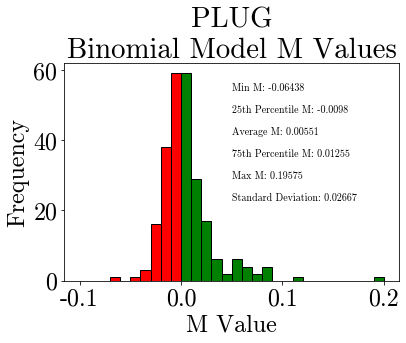





The most negative slope for NEE Pre-March 11, 2020, is:
-0.016

The 25th percentile slope for NEE Pre-March 11, 2020, is:
-0.002

The average slope for NEE Pre-March 11, 2020, is:
0.001

The 75th percentile slope for NEE Pre-March 11, 2020, is:
0.004

The most positive slope for NEE Pre-March 11, 2020, is:
0.01

The standard deviation of the slopes for NEE Pre-March 11, 2020, is:
0.004

NEE Pre-March 11, 2020, outperformed the one week expectation value 47% of the time. 



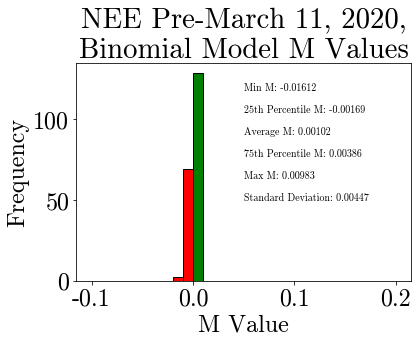





The most negative slope for TSLA Pre-March 11, 2020, is:
-0.041

The 25th percentile slope for TSLA Pre-March 11, 2020, is:
-0.007

The average slope for TSLA Pre-March 11, 2020, is:
0.002

The 75th percentile slope for TSLA Pre-March 11, 2020, is:
0.01

The most positive slope for TSLA Pre-March 11, 2020, is:
0.097

The standard deviation of the slopes for TSLA Pre-March 11, 2020, is:
0.016

TSLA Pre-March 11, 2020, outperformed the one week expectation value 49% of the time. 



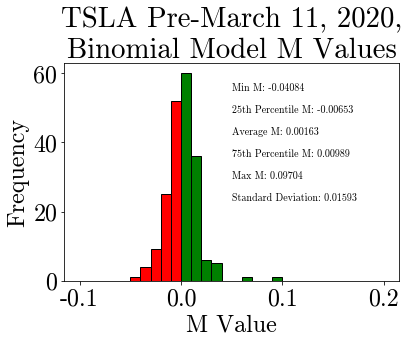





The most negative slope for FSLR Pre-March 11, 2020, is:
-0.04

The 25th percentile slope for FSLR Pre-March 11, 2020, is:
-0.007

The average slope for FSLR Pre-March 11, 2020, is:
0.0

The 75th percentile slope for FSLR Pre-March 11, 2020, is:
0.006

The most positive slope for FSLR Pre-March 11, 2020, is:
0.054

The standard deviation of the slopes for FSLR Pre-March 11, 2020, is:
0.013

FSLR Pre-March 11, 2020, outperformed the one week expectation value 52% of the time. 



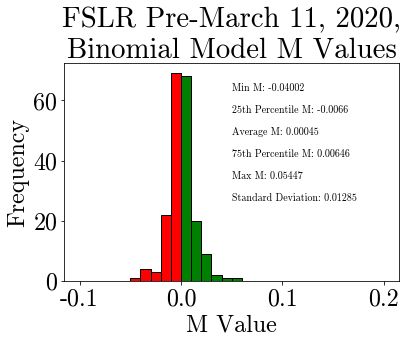





The most negative slope for RUN Pre-March 11, 2020, is:
-0.048

The 25th percentile slope for RUN Pre-March 11, 2020, is:
-0.006

The average slope for RUN Pre-March 11, 2020, is:
0.002

The 75th percentile slope for RUN Pre-March 11, 2020, is:
0.01

The most positive slope for RUN Pre-March 11, 2020, is:
0.072

The standard deviation of the slopes for RUN Pre-March 11, 2020, is:
0.015

RUN Pre-March 11, 2020, outperformed the one week expectation value 49% of the time. 



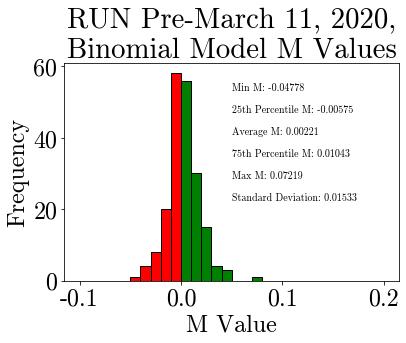





The most negative slope for CWEN Pre-March 11, 2020, is:
-0.033

The 25th percentile slope for CWEN Pre-March 11, 2020, is:
-0.003

The average slope for CWEN Pre-March 11, 2020, is:
0.001

The 75th percentile slope for CWEN Pre-March 11, 2020, is:
0.005

The most positive slope for CWEN Pre-March 11, 2020, is:
0.019

The standard deviation of the slopes for CWEN Pre-March 11, 2020, is:
0.008

CWEN Pre-March 11, 2020, outperformed the one week expectation value 52% of the time. 



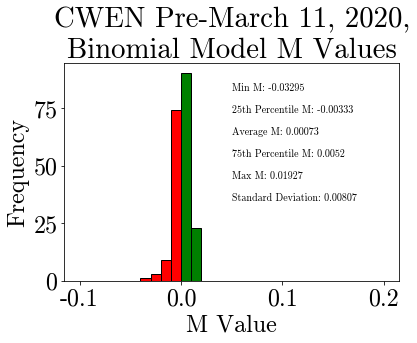





The most negative slope for PLUG Pre-March 11, 2020, is:
-0.064

The 25th percentile slope for PLUG Pre-March 11, 2020, is:
-0.009

The average slope for PLUG Pre-March 11, 2020, is:
0.002

The 75th percentile slope for PLUG Pre-March 11, 2020, is:
0.01

The most positive slope for PLUG Pre-March 11, 2020, is:
0.196

The standard deviation of the slopes for PLUG Pre-March 11, 2020, is:
0.024

PLUG Pre-March 11, 2020, outperformed the one week expectation value 48% of the time. 



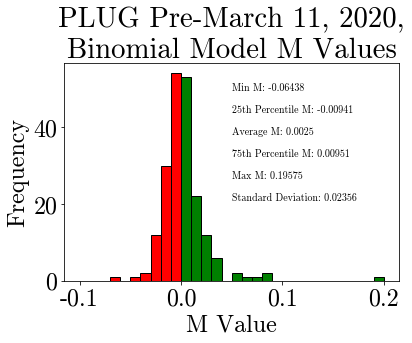





The most negative slope for NEE Post-March 11, 2020, is:
-0.017

The 25th percentile slope for NEE Post-March 11, 2020, is:
-0.002

The average slope for NEE Post-March 11, 2020, is:
0.003

The 75th percentile slope for NEE Post-March 11, 2020, is:
0.006

The most positive slope for NEE Post-March 11, 2020, is:
0.037

The standard deviation of the slopes for NEE Post-March 11, 2020, is:
0.01

NEE Post-March 11, 2020, outperformed the one week expectation value 49% of the time. 



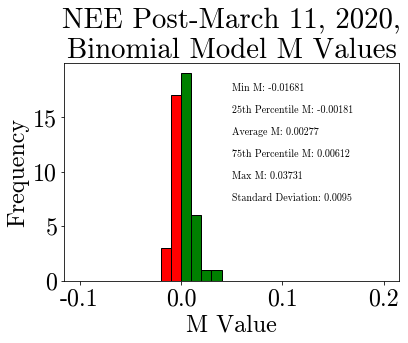





The most negative slope for TSLA Post-March 11, 2020, is:
-0.079

The 25th percentile slope for TSLA Post-March 11, 2020, is:
-0.004

The average slope for TSLA Post-March 11, 2020, is:
0.011

The 75th percentile slope for TSLA Post-March 11, 2020, is:
0.028

The most positive slope for TSLA Post-March 11, 2020, is:
0.104

The standard deviation of the slopes for TSLA Post-March 11, 2020, is:
0.031

TSLA Post-March 11, 2020, outperformed the one week expectation value 53% of the time. 



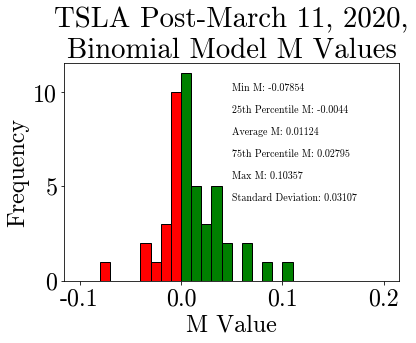





The most negative slope for FSLR Post-March 11, 2020, is:
-0.038

The 25th percentile slope for FSLR Post-March 11, 2020, is:
-0.001

The average slope for FSLR Post-March 11, 2020, is:
0.007

The 75th percentile slope for FSLR Post-March 11, 2020, is:
0.019

The most positive slope for FSLR Post-March 11, 2020, is:
0.051

The standard deviation of the slopes for FSLR Post-March 11, 2020, is:
0.017

FSLR Post-March 11, 2020, outperformed the one week expectation value 49% of the time. 



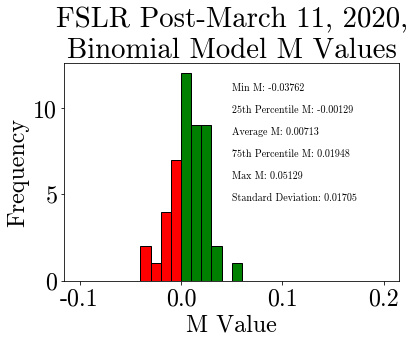





The most negative slope for RUN Post-March 11, 2020, is:
-0.081

The 25th percentile slope for RUN Post-March 11, 2020, is:
-0.007

The average slope for RUN Post-March 11, 2020, is:
0.01

The 75th percentile slope for RUN Post-March 11, 2020, is:
0.029

The most positive slope for RUN Post-March 11, 2020, is:
0.093

The standard deviation of the slopes for RUN Post-March 11, 2020, is:
0.032

RUN Post-March 11, 2020, outperformed the one week expectation value 49% of the time. 



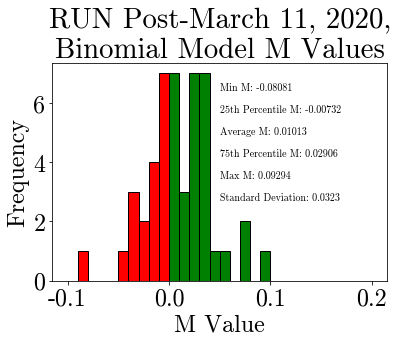





The most negative slope for CWEN Post-March 11, 2020, is:
-0.028

The 25th percentile slope for CWEN Post-March 11, 2020, is:
-0.003

The average slope for CWEN Post-March 11, 2020, is:
0.004

The 75th percentile slope for CWEN Post-March 11, 2020, is:
0.01

The most positive slope for CWEN Post-March 11, 2020, is:
0.036

The standard deviation of the slopes for CWEN Post-March 11, 2020, is:
0.012

CWEN Post-March 11, 2020, outperformed the one week expectation value 57% of the time. 



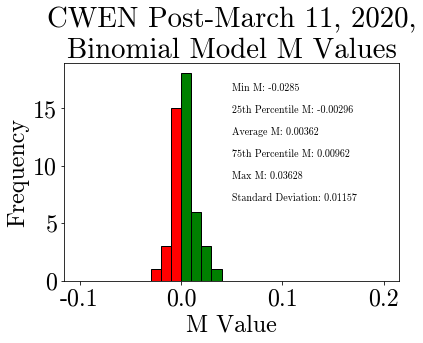





The most negative slope for PLUG Post-March 11, 2020, is:
-0.027

The 25th percentile slope for PLUG Post-March 11, 2020, is:
-0.009

The average slope for PLUG Post-March 11, 2020, is:
0.019

The 75th percentile slope for PLUG Post-March 11, 2020, is:
0.046

The most positive slope for PLUG Post-March 11, 2020, is:
0.112

The standard deviation of the slopes for PLUG Post-March 11, 2020, is:
0.034

PLUG Post-March 11, 2020, outperformed the one week expectation value 47% of the time. 



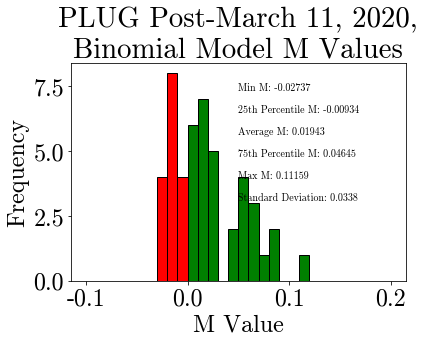

In [23]:
for stock in renewable:
    analyze_m(stock)
for stock in renewable_pre:
    analyze_m(stock)
for stock in renewable_post:
    analyze_m(stock)


The most negative slope for XOM is:
-0.041

The 25th percentile slope for XOM is:
-0.003

The average slope for XOM is:
0.0

The 75th percentile slope for XOM is:
0.004

The most positive slope for XOM is:
0.028

The standard deviation of the slopes for XOM is:
0.009

XOM outperformed the one week expectation value 49% of the time. 



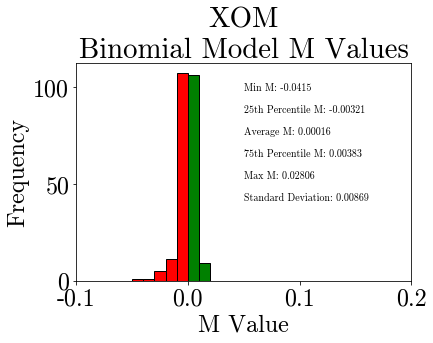





The most negative slope for CVX is:
-0.033

The 25th percentile slope for CVX is:
-0.003

The average slope for CVX is:
0.001

The 75th percentile slope for CVX is:
0.005

The most positive slope for CVX is:
0.059

The standard deviation of the slopes for CVX is:
0.009

CVX outperformed the one week expectation value 48% of the time. 



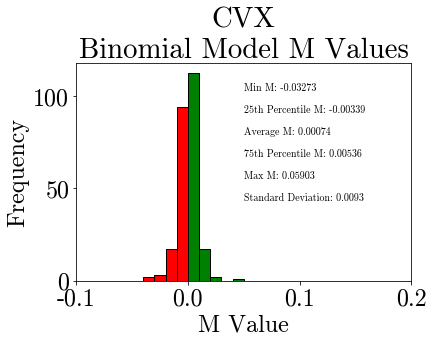





The most negative slope for COP is:
-0.069

The 25th percentile slope for COP is:
-0.005

The average slope for COP is:
0.001

The 75th percentile slope for COP is:
0.006

The most positive slope for COP is:
0.098

The standard deviation of the slopes for COP is:
0.014

COP outperformed the one week expectation value 50% of the time. 



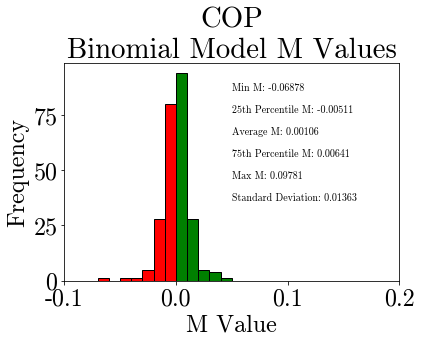





The most negative slope for BTU is:
-0.101

The 25th percentile slope for BTU is:
-0.01

The average slope for BTU is:
-0.0

The 75th percentile slope for BTU is:
0.009

The most positive slope for BTU is:
0.117

The standard deviation of the slopes for BTU is:
0.027

BTU outperformed the one week expectation value 50% of the time. 



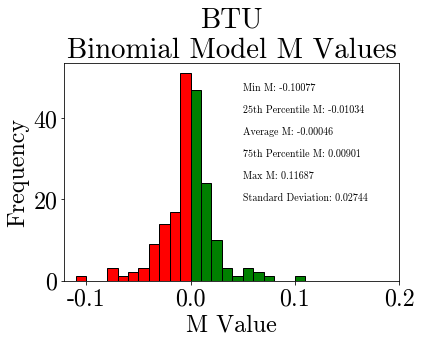





The most negative slope for ARCH is:
-0.06

The 25th percentile slope for ARCH is:
-0.006

The average slope for ARCH is:
0.001

The 75th percentile slope for ARCH is:
0.008

The most positive slope for ARCH is:
0.063

The standard deviation of the slopes for ARCH is:
0.015

ARCH outperformed the one week expectation value 50% of the time. 



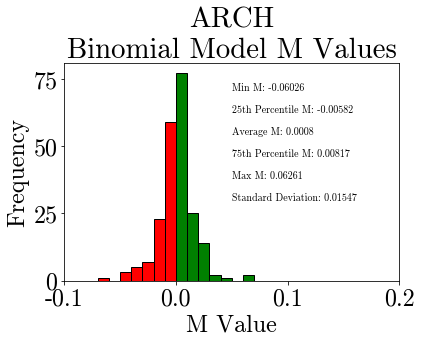





The most negative slope for XOM Pre-March 11, 2020, is:
-0.025

The 25th percentile slope for XOM Pre-March 11, 2020, is:
-0.003

The average slope for XOM Pre-March 11, 2020, is:
-0.0

The 75th percentile slope for XOM Pre-March 11, 2020, is:
0.003

The most positive slope for XOM Pre-March 11, 2020, is:
0.02

The standard deviation of the slopes for XOM Pre-March 11, 2020, is:
0.006

XOM Pre-March 11, 2020, outperformed the one week expectation value 50% of the time. 



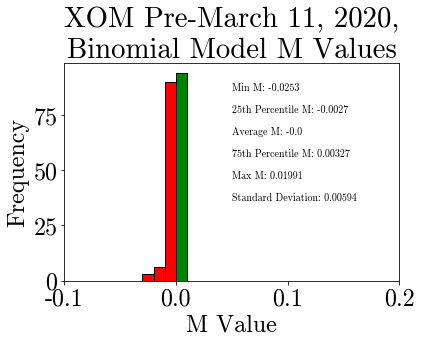





The most negative slope for CVX Pre-March 11, 2020, is:
-0.023

The 25th percentile slope for CVX Pre-March 11, 2020, is:
-0.003

The average slope for CVX Pre-March 11, 2020, is:
0.001

The 75th percentile slope for CVX Pre-March 11, 2020, is:
0.005

The most positive slope for CVX Pre-March 11, 2020, is:
0.016

The standard deviation of the slopes for CVX Pre-March 11, 2020, is:
0.006

CVX Pre-March 11, 2020, outperformed the one week expectation value 48% of the time. 



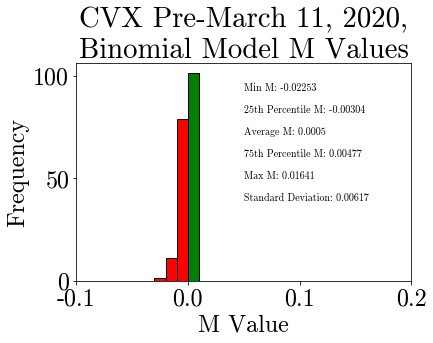





The most negative slope for COP Pre-March 11, 2020, is:
-0.023

The 25th percentile slope for COP Pre-March 11, 2020, is:
-0.005

The average slope for COP Pre-March 11, 2020, is:
0.001

The 75th percentile slope for COP Pre-March 11, 2020, is:
0.006

The most positive slope for COP Pre-March 11, 2020, is:
0.034

The standard deviation of the slopes for COP Pre-March 11, 2020, is:
0.009

COP Pre-March 11, 2020, outperformed the one week expectation value 50% of the time. 



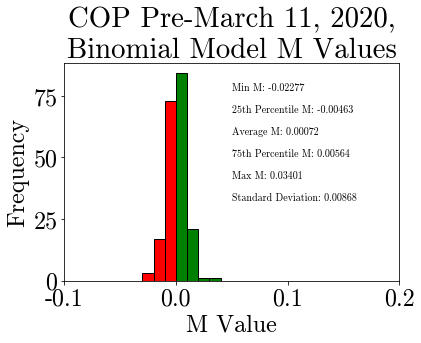





The most negative slope for BTU Pre-March 11, 2020, is:
-0.057

The 25th percentile slope for BTU Pre-March 11, 2020, is:
-0.008

The average slope for BTU Pre-March 11, 2020, is:
-0.001

The 75th percentile slope for BTU Pre-March 11, 2020, is:
0.008

The most positive slope for BTU Pre-March 11, 2020, is:
0.03

The standard deviation of the slopes for BTU Pre-March 11, 2020, is:
0.014

BTU Pre-March 11, 2020, outperformed the one week expectation value 50% of the time. 



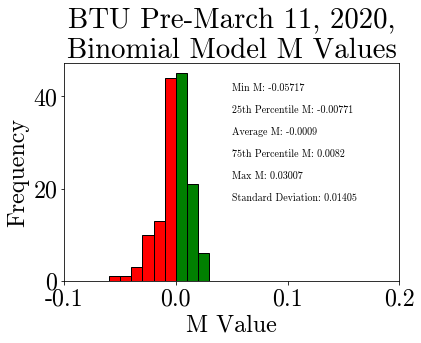





The most negative slope for ARCH Pre-March 11, 2020, is:
-0.048

The 25th percentile slope for ARCH Pre-March 11, 2020, is:
-0.005

The average slope for ARCH Pre-March 11, 2020, is:
0.001

The 75th percentile slope for ARCH Pre-March 11, 2020, is:
0.006

The most positive slope for ARCH Pre-March 11, 2020, is:
0.063

The standard deviation of the slopes for ARCH Pre-March 11, 2020, is:
0.012

ARCH Pre-March 11, 2020, outperformed the one week expectation value 48% of the time. 



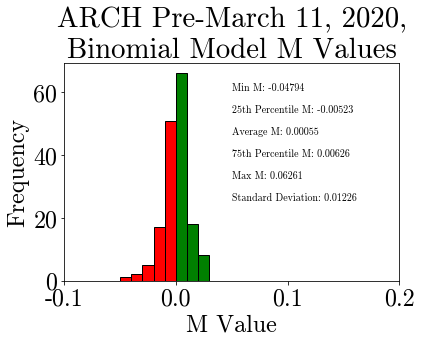





The most negative slope for XOM Post-March 11, 2020, is:
-0.032

The 25th percentile slope for XOM Post-March 11, 2020, is:
-0.008

The average slope for XOM Post-March 11, 2020, is:
0.002

The 75th percentile slope for XOM Post-March 11, 2020, is:
0.01

The most positive slope for XOM Post-March 11, 2020, is:
0.028

The standard deviation of the slopes for XOM Post-March 11, 2020, is:
0.014

XOM Post-March 11, 2020, outperformed the one week expectation value 47% of the time. 



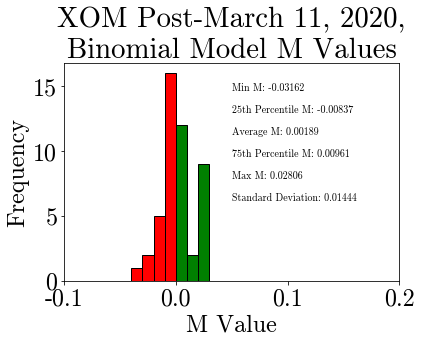





The most negative slope for CVX Post-March 11, 2020, is:
-0.033

The 25th percentile slope for CVX Post-March 11, 2020, is:
-0.006

The average slope for CVX Post-March 11, 2020, is:
0.003

The 75th percentile slope for CVX Post-March 11, 2020, is:
0.012

The most positive slope for CVX Post-March 11, 2020, is:
0.059

The standard deviation of the slopes for CVX Post-March 11, 2020, is:
0.016

CVX Post-March 11, 2020, outperformed the one week expectation value 47% of the time. 



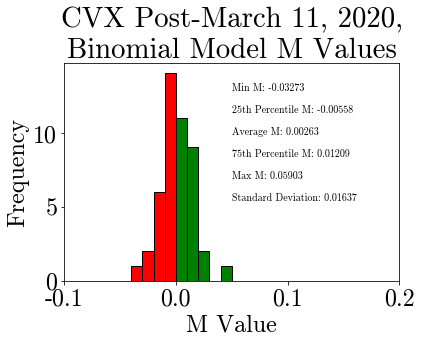





The most negative slope for COP Post-March 11, 2020, is:
-0.043

The 25th percentile slope for COP Post-March 11, 2020, is:
-0.012

The average slope for COP Post-March 11, 2020, is:
0.004

The 75th percentile slope for COP Post-March 11, 2020, is:
0.018

The most positive slope for COP Post-March 11, 2020, is:
0.098

The standard deviation of the slopes for COP Post-March 11, 2020, is:
0.023

COP Post-March 11, 2020, outperformed the one week expectation value 49% of the time. 



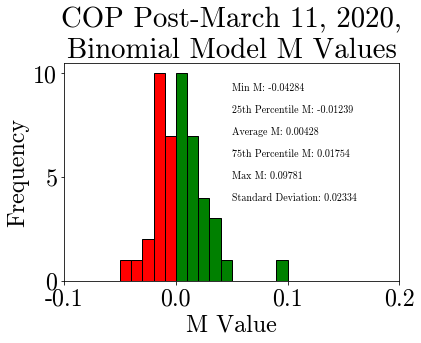





The most negative slope for BTU Post-March 11, 2020, is:
-0.05

The 25th percentile slope for BTU Post-March 11, 2020, is:
-0.024

The average slope for BTU Post-March 11, 2020, is:
0.013

The 75th percentile slope for BTU Post-March 11, 2020, is:
0.044

The most positive slope for BTU Post-March 11, 2020, is:
0.153

The standard deviation of the slopes for BTU Post-March 11, 2020, is:
0.047

BTU Post-March 11, 2020, outperformed the one week expectation value 53% of the time. 



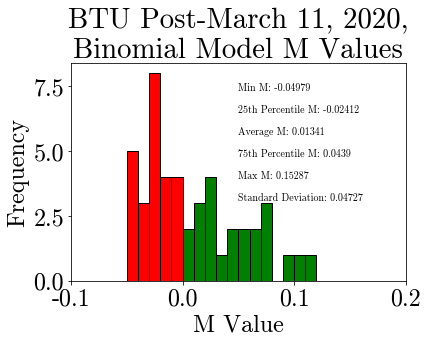





The most negative slope for ARCH Post-March 11, 2020, is:
-0.031

The 25th percentile slope for ARCH Post-March 11, 2020, is:
-0.009

The average slope for ARCH Post-March 11, 2020, is:
0.006

The 75th percentile slope for ARCH Post-March 11, 2020, is:
0.019

The most positive slope for ARCH Post-March 11, 2020, is:
0.055

The standard deviation of the slopes for ARCH Post-March 11, 2020, is:
0.02

ARCH Post-March 11, 2020, outperformed the one week expectation value 51% of the time. 



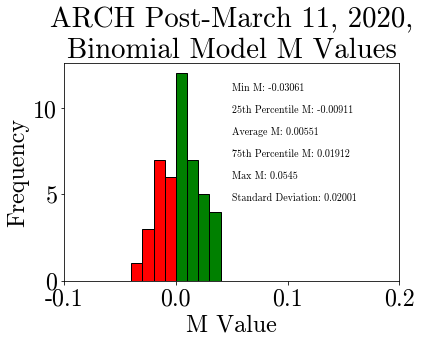

In [138]:
for stock in fossil:
    analyze_m(stock)
for stock in fossil_pre:
    analyze_m(stock)
for stock in fossil_post:
    analyze_m(stock)


The most negative slope for DJIA is:
-0.045

The 25th percentile slope for DJIA is:
-0.002

The average slope for DJIA is:
0.0

The 75th percentile slope for DJIA is:
0.003

The most positive slope for DJIA is:
0.02

The standard deviation of the slopes for DJIA is:
0.006

DJIA outperformed the one week expectation value 46% of the time. 



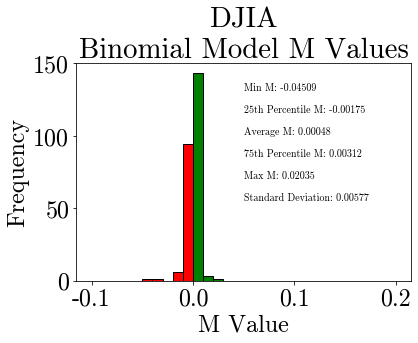





The most negative slope for NDAQ is:
-0.058

The 25th percentile slope for NDAQ is:
-0.003

The average slope for NDAQ is:
0.001

The 75th percentile slope for NDAQ is:
0.004

The most positive slope for NDAQ is:
0.05

The standard deviation of the slopes for NDAQ is:
0.008

NDAQ outperformed the one week expectation value 50% of the time. 



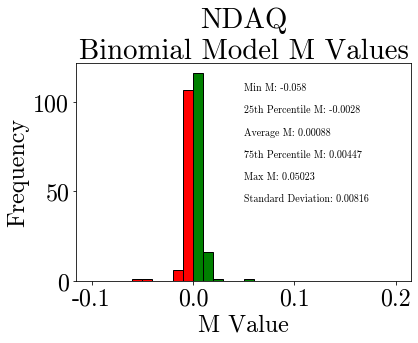





The most negative slope for RUT is:
-0.055

The 25th percentile slope for RUT is:
-0.003

The average slope for RUT is:
0.001

The 75th percentile slope for RUT is:
0.004

The most positive slope for RUT is:
0.022

The standard deviation of the slopes for RUT is:
0.007

RUT outperformed the one week expectation value 45% of the time. 



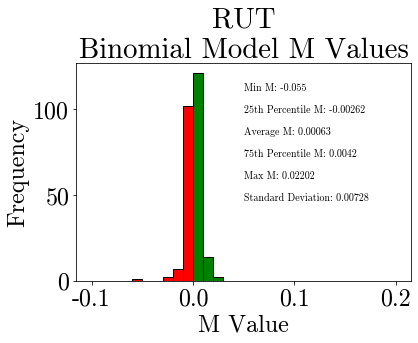





The most negative slope for GSPC is:
-0.04

The 25th percentile slope for GSPC is:
-0.002

The average slope for GSPC is:
0.0

The 75th percentile slope for GSPC is:
0.003

The most positive slope for GSPC is:
0.019

The standard deviation of the slopes for GSPC is:
0.006

GSPC outperformed the one week expectation value 47% of the time. 



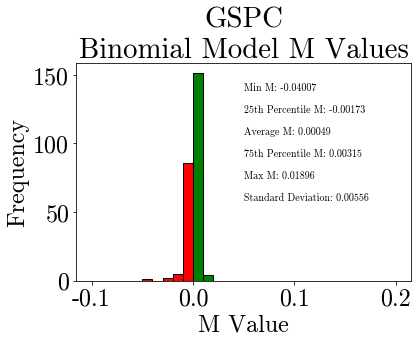





The most negative slope for DJIA Pre-March 11, 2020, is:
-0.016

The 25th percentile slope for DJIA Pre-March 11, 2020, is:
-0.002

The average slope for DJIA Pre-March 11, 2020, is:
0.001

The 75th percentile slope for DJIA Pre-March 11, 2020, is:
0.003

The most positive slope for DJIA Pre-March 11, 2020, is:
0.009

The standard deviation of the slopes for DJIA Pre-March 11, 2020, is:
0.004

DJIA Pre-March 11, 2020, outperformed the one week expectation value 47% of the time. 



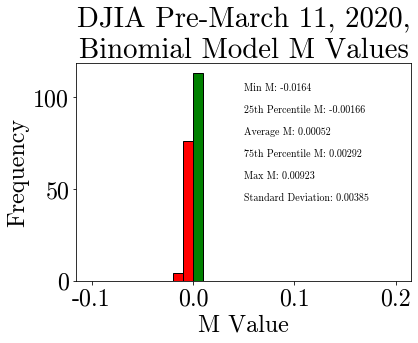





The most negative slope for NDAQ Pre-March 11, 2020, is:
-0.013

The 25th percentile slope for NDAQ Pre-March 11, 2020, is:
-0.003

The average slope for NDAQ Pre-March 11, 2020, is:
0.001

The 75th percentile slope for NDAQ Pre-March 11, 2020, is:
0.004

The most positive slope for NDAQ Pre-March 11, 2020, is:
0.015

The standard deviation of the slopes for NDAQ Pre-March 11, 2020, is:
0.006

NDAQ Pre-March 11, 2020, outperformed the one week expectation value 51% of the time. 



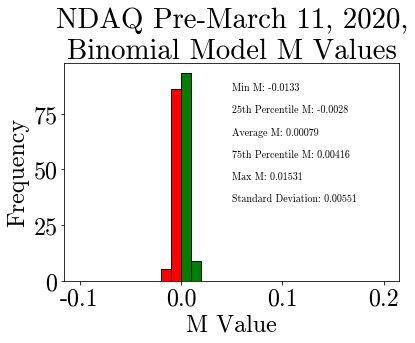





The most negative slope for RUT Pre-March 11, 2020, is:
-0.015

The 25th percentile slope for RUT Pre-March 11, 2020, is:
-0.003

The average slope for RUT Pre-March 11, 2020, is:
0.001

The 75th percentile slope for RUT Pre-March 11, 2020, is:
0.004

The most positive slope for RUT Pre-March 11, 2020, is:
0.016

The standard deviation of the slopes for RUT Pre-March 11, 2020, is:
0.005

RUT Pre-March 11, 2020, outperformed the one week expectation value 46% of the time. 



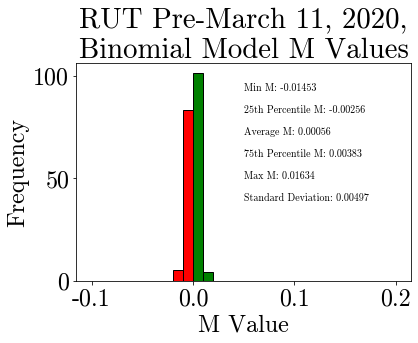





The most negative slope for GSPC Pre-March 11, 2020, is:
-0.015

The 25th percentile slope for GSPC Pre-March 11, 2020, is:
-0.002

The average slope for GSPC Pre-March 11, 2020, is:
0.0

The 75th percentile slope for GSPC Pre-March 11, 2020, is:
0.003

The most positive slope for GSPC Pre-March 11, 2020, is:
0.009

The standard deviation of the slopes for GSPC Pre-March 11, 2020, is:
0.004

GSPC Pre-March 11, 2020, outperformed the one week expectation value 44% of the time. 



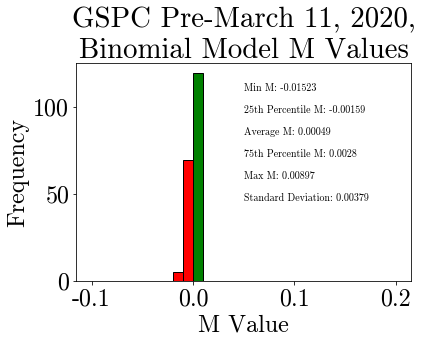





The most negative slope for DJIA Post-March 11, 2020, is:
-0.02

The 25th percentile slope for DJIA Post-March 11, 2020, is:
-0.002

The average slope for DJIA Post-March 11, 2020, is:
0.002

The 75th percentile slope for DJIA Post-March 11, 2020, is:
0.006

The most positive slope for DJIA Post-March 11, 2020, is:
0.021

The standard deviation of the slopes for DJIA Post-March 11, 2020, is:
0.007

DJIA Post-March 11, 2020, outperformed the one week expectation value 52% of the time. 



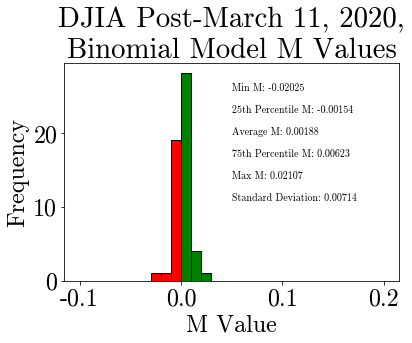





The most negative slope for NDAQ Post-March 11, 2020, is:
-0.019

The 25th percentile slope for NDAQ Post-March 11, 2020, is:
-0.001

The average slope for NDAQ Post-March 11, 2020, is:
0.002

The 75th percentile slope for NDAQ Post-March 11, 2020, is:
0.006

The most positive slope for NDAQ Post-March 11, 2020, is:
0.024

The standard deviation of the slopes for NDAQ Post-March 11, 2020, is:
0.008

NDAQ Post-March 11, 2020, outperformed the one week expectation value 52% of the time. 



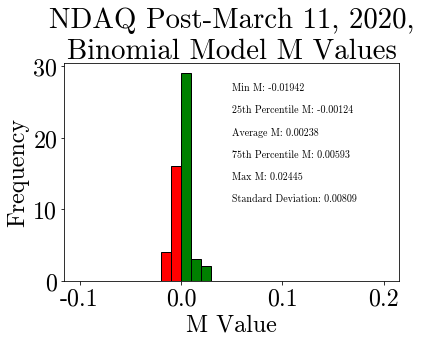





The most negative slope for RUT Post-March 11, 2020, is:
-0.026

The 25th percentile slope for RUT Post-March 11, 2020, is:
-0.003

The average slope for RUT Post-March 11, 2020, is:
0.004

The 75th percentile slope for RUT Post-March 11, 2020, is:
0.01

The most positive slope for RUT Post-March 11, 2020, is:
0.03

The standard deviation of the slopes for RUT Post-March 11, 2020, is:
0.01

RUT Post-March 11, 2020, outperformed the one week expectation value 48% of the time. 



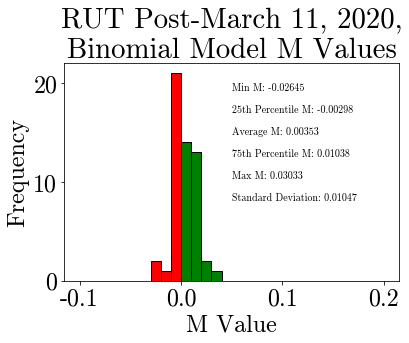





The most negative slope for GSPC Post-March 11, 2020, is:
-0.015

The 25th percentile slope for GSPC Post-March 11, 2020, is:
-0.002

The average slope for GSPC Post-March 11, 2020, is:
0.002

The 75th percentile slope for GSPC Post-March 11, 2020, is:
0.006

The most positive slope for GSPC Post-March 11, 2020, is:
0.02

The standard deviation of the slopes for GSPC Post-March 11, 2020, is:
0.007

GSPC Post-March 11, 2020, outperformed the one week expectation value 52% of the time. 



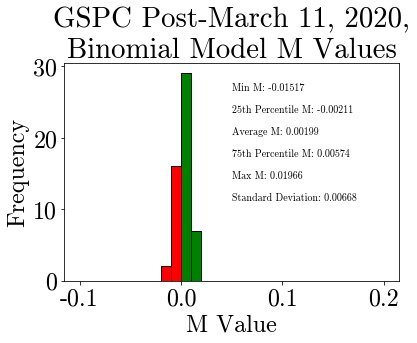

In [24]:
for stock in market:
    analyze_m(stock)
for stock in market_pre:
    analyze_m(stock)
for stock in market_post:
    analyze_m(stock)

In [25]:
def analyze_group_m(plot_name,tickers_list):
    weekly_m = []
    overperform = []
    for ticker in tickers_list:
        capital_ticker = ticker.upper()
        stock_data = pd.read_csv("./data_to_Mar_6/"+ticker+".csv")
        close_prices = stock_data['Close'].values.tolist()
        possible_q = np.arange(0.01,0.99,step=0.01)
        weekly_q = []
        for week in range(int(len(close_prices)/5)-2):    
            first_day_of_range = 5 * week
            last_day_of_range = 5 * week + 10
            q_errors = []
            for q in possible_q:
                test = error_fun(q,ticker,close_prices[first_day_of_range:last_day_of_range])
                q_errors.append([q,test])
            optimal_q = min(q_errors, key = lambda t: t[1])
            weekly_q.append(optimal_q[0])
            m,ev4 = slope(optimal_q[0],ticker,close_prices[first_day_of_range:last_day_of_range])
            weekly_m.append(m)
            if ev4 < close_prices[last_day_of_range]:
                overperform.append(1)
            elif ev4 > close_prices[last_day_of_range]:
                overperform.append(0)
            else:
                print("Trouble in paradise")

    avg_m = np.mean(weekly_m)
    max_m = max(weekly_m)
    min_m = min(weekly_m)
    seventyfifth_per = np.percentile(weekly_m,75)
    twentyfifth_per = np.percentile(weekly_m,25)
    overperform_percent = np.mean(overperform) * 100
    std_m = np.std(weekly_m)

    print("\nThe most negative slope for " + plot_name + " is:")
    print(round(min_m,5))

    print("\nThe 25th percentile slope for " + plot_name + " is:")
    print(round(twentyfifth_per,5))

    print("\nThe average slope for " + plot_name + " is:")
    print(round(avg_m,5))
    
    print("\nThe 75th percentile slope for " + plot_name + " is:")
    print(round(seventyfifth_per,5))
    
    print("\nThe most positive slope for " + plot_name + " is:")
    print(round(max_m,5))

    print("\nThe standard deviation of the slopes for " + plot_name + " is:")
    print(round(std_m,5))

    print("\n" + plot_name + " outperformed the one week expectation value " + str(round(overperform_percent)) + "% of the time. \n")


    n, bins, patches = plt.hist(weekly_m, 
    bins=np.arange(-0.1,0.2,0.01),
    edgecolor="black", 
    #weights=np.ones(len(weekly_q)) / len(weekly_q),
    color='green')

    for i in range(len(bins)):
        if bins[i] < -0.0001:
            plt.setp(patches[i], 'facecolor', 'r')

    max_n = max(n)

    plt.annotate('Min M: ' + str(round(min_m,5)) +
                '\n\n25th Percentile M: ' + str(round(twentyfifth_per,5)) +
                '\n\nAverage M: ' + str(round(avg_m,5)) +
                '\n\n75th Percentile M: ' + str(round(seventyfifth_per,5)) +
                '\n\nMax M: ' + str(round(max_m,5)) +
                '\n\nStandard Deviation: ' + str(round(std_m,5)), # this is the text
        (0.05, 2/3 * max_n), # this is the point to label
        va='center',
        ha='left',
        c='black',
        fontname='cmr10',
        fontsize=10)

    plt.xticks(np.arange(-0.10,0.20,0.1))
    plt.xlabel("M Value")
    plt.ylabel("Frequency")
    #plt.xticks(np.arange(0, 1, step=0.1))
    plt.title(plot_name + "\nBinomial Model M Values")
    plt.show()

    print("\n\n")


The most negative slope for Renewable Group is:
-0.08081

The 25th percentile slope for Renewable Group is:
-0.00517

The average slope for Renewable Group is:
0.00271

The 75th percentile slope for Renewable Group is:
0.00826

The most positive slope for Renewable Group is:
0.19575

The standard deviation of the slopes for Renewable Group is:
0.01756

Renewable Group outperformed the one week expectation value 49% of the time. 



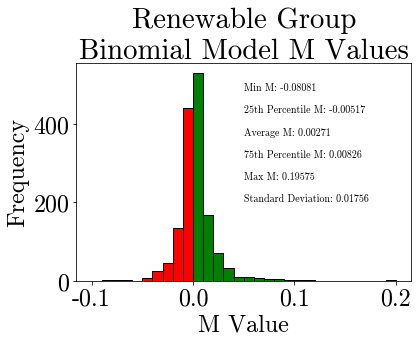





The most negative slope for Renewable Group Pre-March 11, 2020, is:
-0.06438

The 25th percentile slope for Renewable Group Pre-March 11, 2020, is:
-0.00522

The average slope for Renewable Group Pre-March 11, 2020, is:
0.00142

The 75th percentile slope for Renewable Group Pre-March 11, 2020, is:
0.00709

The most positive slope for Renewable Group Pre-March 11, 2020, is:
0.19575

The standard deviation of the slopes for Renewable Group Pre-March 11, 2020, is:
0.01471

Renewable Group Pre-March 11, 2020, outperformed the one week expectation value 49% of the time. 



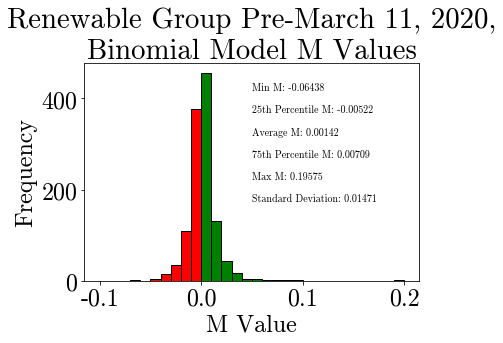





The most negative slope for Renewable Group Post-March 11, 2020, is:
-0.08081

The 25th percentile slope for Renewable Group Post-March 11, 2020, is:
-0.003

The average slope for Renewable Group Post-March 11, 2020, is:
0.00905

The 75th percentile slope for Renewable Group Post-March 11, 2020, is:
0.01901

The most positive slope for Renewable Group Post-March 11, 2020, is:
0.11159

The standard deviation of the slopes for Renewable Group Post-March 11, 2020, is:
0.02534

Renewable Group Post-March 11, 2020, outperformed the one week expectation value 51% of the time. 



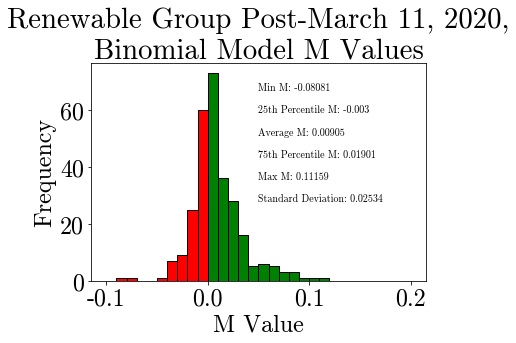

In [27]:
analyze_group_m("Renewable Group",renewable)
analyze_group_m("Renewable Group Pre-March 11, 2020,",renewable_pre)
analyze_group_m("Renewable Group Post-March 11, 2020,",renewable_post)


The most negative slope for Fossil Fuel Group is:
-0.10077

The 25th percentile slope for Fossil Fuel Group is:
-0.00491

The average slope for Fossil Fuel Group is:
0.00049

The 75th percentile slope for Fossil Fuel Group is:
0.00575

The most positive slope for Fossil Fuel Group is:
0.11687

The standard deviation of the slopes for Fossil Fuel Group is:
0.0157

Fossil Fuel Group outperformed the one week expectation value 49% of the time. 



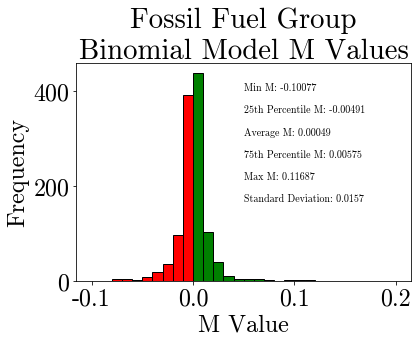





The most negative slope for Fossil Fuel Group Pre-March 11, 2020, is:
-0.05717

The 25th percentile slope for Fossil Fuel Group Pre-March 11, 2020, is:
-0.00393

The average slope for Fossil Fuel Group Pre-March 11, 2020, is:
0.00023

The 75th percentile slope for Fossil Fuel Group Pre-March 11, 2020, is:
0.00506

The most positive slope for Fossil Fuel Group Pre-March 11, 2020, is:
0.06261

The standard deviation of the slopes for Fossil Fuel Group Pre-March 11, 2020, is:
0.00959

Fossil Fuel Group Pre-March 11, 2020, outperformed the one week expectation value 49% of the time. 



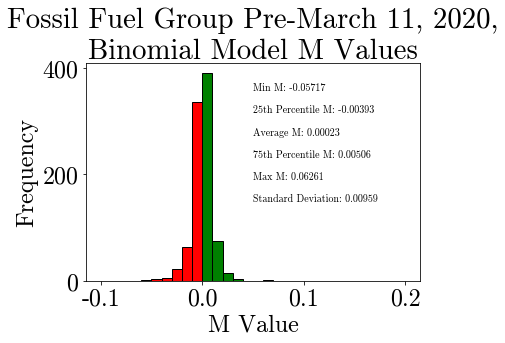





The most negative slope for Fossil Fuel Group Post-March 11, 2020, is:
-0.04979

The 25th percentile slope for Fossil Fuel Group Post-March 11, 2020, is:
-0.01062

The average slope for Fossil Fuel Group Post-March 11, 2020, is:
0.00554

The 75th percentile slope for Fossil Fuel Group Post-March 11, 2020, is:
0.01771

The most positive slope for Fossil Fuel Group Post-March 11, 2020, is:
0.15287

The standard deviation of the slopes for Fossil Fuel Group Post-March 11, 2020, is:
0.02736

Fossil Fuel Group Post-March 11, 2020, outperformed the one week expectation value 49% of the time. 



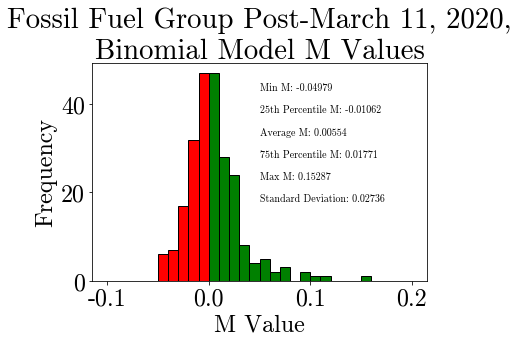

In [28]:
analyze_group_m("Fossil Fuel Group",fossil)
analyze_group_m("Fossil Fuel Group Pre-March 11, 2020,",fossil_pre)
analyze_group_m("Fossil Fuel Group Post-March 11, 2020,",fossil_post)


The most negative slope for Market Indices is:
-0.058

The 25th percentile slope for Market Indices is:
-0.00229

The average slope for Market Indices is:
0.00062

The 75th percentile slope for Market Indices is:
0.00375

The most positive slope for Market Indices is:
0.05023

The standard deviation of the slopes for Market Indices is:
0.00678

Market Indices outperformed the one week expectation value 47% of the time. 



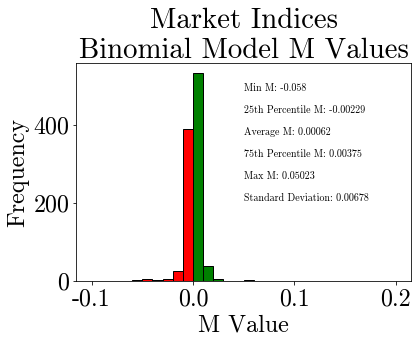





The most negative slope for Market Indices Pre-March 11, 2020, is:
-0.0164

The 25th percentile slope for Market Indices Pre-March 11, 2020, is:
-0.00214

The average slope for Market Indices Pre-March 11, 2020, is:
0.00059

The 75th percentile slope for Market Indices Pre-March 11, 2020, is:
0.00337

The most positive slope for Market Indices Pre-March 11, 2020, is:
0.01634

The standard deviation of the slopes for Market Indices Pre-March 11, 2020, is:
0.00459

Market Indices Pre-March 11, 2020, outperformed the one week expectation value 47% of the time. 



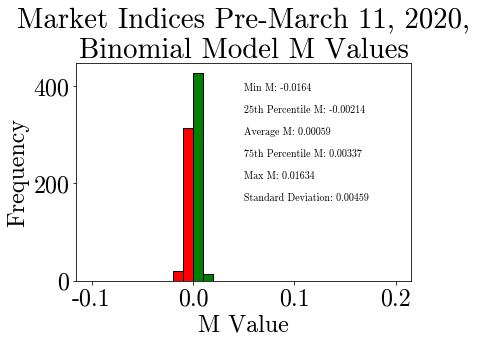





The most negative slope for Market Indices Post-March 11, 2020, is:
-0.02645

The 25th percentile slope for Market Indices Post-March 11, 2020, is:
-0.002

The average slope for Market Indices Post-March 11, 2020, is:
0.00245

The 75th percentile slope for Market Indices Post-March 11, 2020, is:
0.00722

The most positive slope for Market Indices Post-March 11, 2020, is:
0.03033

The standard deviation of the slopes for Market Indices Post-March 11, 2020, is:
0.00825

Market Indices Post-March 11, 2020, outperformed the one week expectation value 51% of the time. 



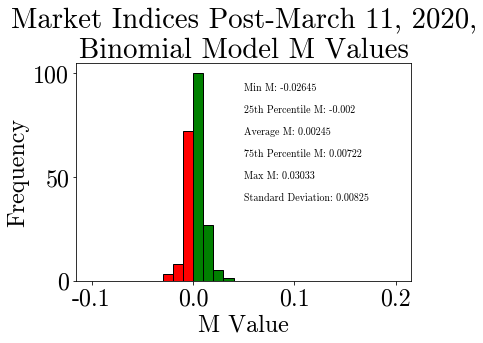

In [29]:
analyze_group_m("Market Indices",market)
analyze_group_m("Market Indices Pre-March 11, 2020,",market_pre)
analyze_group_m("Market Indices Post-March 11, 2020,",market_post)

In [122]:
weekly_m1 = []
overperform = []
for ticker in renewable:
    capital_ticker = ticker.upper()
    stock_data = pd.read_csv("./data_to_Mar_6/"+ticker+".csv")
    close_prices = stock_data['Close'].values.tolist()
    possible_q = np.arange(0.01,0.99,step=0.01)
    weekly_q = []
    for week in range(int(len(close_prices)/5)-2):    
        first_day_of_range = 5 * week
        last_day_of_range = 5 * week + 10
        q_errors = []
        for q in possible_q:
            test = error_fun(q,ticker,close_prices[first_day_of_range:last_day_of_range])
            q_errors.append([q,test])
        optimal_q = min(q_errors, key = lambda t: t[1])
        weekly_q.append(optimal_q[0])
        m,ev4 = slope(optimal_q[0],ticker,close_prices[first_day_of_range:last_day_of_range])
        weekly_m1.append(m)
        if ev4 < close_prices[last_day_of_range]:
            overperform.append(1)
        elif ev4 > close_prices[last_day_of_range]:
            overperform.append(0)
        else:
            print("Trouble in paradise")

avg_1 = np.mean(weekly_m1)
std_1 = np.std(weekly_m1)
N1 = len(weekly_m1)


weekly_m2 = []
for ticker in fossil:
    capital_ticker = ticker.upper()
    stock_data = pd.read_csv("./data_to_Mar_6/"+ticker+".csv")
    close_prices = stock_data['Close'].values.tolist()
    possible_q = np.arange(0.01,0.99,step=0.01)
    weekly_q = []
    for week in range(int(len(close_prices)/5)-2):    
        first_day_of_range = 5 * week
        last_day_of_range = 5 * week + 10
        q_errors = []
        for q in possible_q:
            test = error_fun(q,ticker,close_prices[first_day_of_range:last_day_of_range])
            q_errors.append([q,test])
        optimal_q = min(q_errors, key = lambda t: t[1])
        weekly_q.append(optimal_q[0])
        m,ev4 = slope(optimal_q[0],ticker,close_prices[first_day_of_range:last_day_of_range])
        weekly_m2.append(m)


avg_2 = np.mean(weekly_m2)
std_2 = np.std(weekly_m2)
N2 = len(weekly_m2)

std_error = np.sqrt((std_1/N1)+(std_2/N2))

t_score = np.abs(avg_1-avg_2)/std_error
deg_free = N1 + N2 - 2

print(avg_1, avg_2, std_1, std_2)
print("T-score: " + str(t_score))
print("Degrees of Freedom: " + str(deg_free))

print("\n\n")

T-score: 0.44198948474461974
Degrees of Freedom: 2653





In [144]:
def analyze_ev_dev(ticker):
    if ticker.endswith("pre"):
        plot_name = ticker[:-4].upper() + " Pre-March 11, 2020,"
    elif ticker.endswith("post"):
        plot_name = ticker[:-5].upper() + " Post-March 11, 2020,"
    else:
        plot_name = ticker.upper()
    
    stock_data = pd.read_csv("./data_to_Mar_6/"+ticker+".csv")
    close_prices = stock_data['Close'].values.tolist()
    possible_q = np.arange(0.01,0.99,step=0.01)
    #weekly_q = []
    #weekly_m = []
    performance = []
    for week in range(int(len(close_prices)/5)-2):    
        first_day_of_range = 5 * week
        last_day_of_range = 5 * week + 10
        q_errors = []
        for q in possible_q:
            test = error_fun(q,ticker,close_prices[first_day_of_range:last_day_of_range])
            q_errors.append([q,test])
        optimal_q = min(q_errors, key = lambda t: t[1])
        m,ev4 = slope(optimal_q[0],ticker,close_prices[first_day_of_range:last_day_of_range])
        weekly_performance = (ev4 - close_prices[last_day_of_range])/ev4*100
        performance.append(weekly_performance)

    avg_m = np.mean(performance)
    max_m = max(performance)
    min_m = min(performance)
    seventyfifth_per = np.percentile(performance,75)
    twentyfifth_per = np.percentile(performance,25)
    std_m = np.std(performance)
    # overperform_percent = np.mean(overperform) * 100

    print("\nThe most negative slope for " + plot_name + " is:")
    print(round(min_m,3))

    print("\nThe 25th percentile slope for " + plot_name + " is:")
    print(round(twentyfifth_per,3))

    print("\nThe average slope for " + plot_name + " is:")
    print(round(avg_m,3))

    print("\nThe 75th percentile slope for " + plot_name + " is:")
    print(round(seventyfifth_per,3))

    print("\nThe most positive slope for " + plot_name + " is:")
    print(round(max_m,3))

    print("\nThe standard deviation of the slopes for " + plot_name + " is:")
    print(round(std_m,3))

    # print("\n" + plot_name + " outperformed the one week expectation value " + str(round(overperform_percent)) + "% of the time. \n")

    max_p = max(performance)
    min_p = min(performance)
    n, bins, patches = plt.hist(performance, 
    bins=np.arange(-50,50,5),
    edgecolor="black", 
    #weights=np.ones(len(weekly_q)) / len(weekly_q),
    color='green')

    for i in range(len(bins)):
       if bins[i] < -0.0001:
           plt.setp(patches[i], 'facecolor', 'r')

    max_n = max(n)

    plt.annotate('Min: ' + str(round(min_m,5)) +
                '\n\n25th Percentile: ' + str(round(twentyfifth_per,5)) +
                '\n\nAverage: ' + str(round(avg_m,5)) +
                '\n\n75th Percentile: ' + str(round(seventyfifth_per,5)) +
                '\n\nMax: ' + str(round(max_m,5))+
                '\n\nStandard Deviation: ' + str(round(std_m,5)), # this is the text
        (-53, 2/3 * max_n), # this is the point to label
        va='center',
        ha='left',
        c='black',
        fontname='cmr10',
        fontsize=10)

    #plt.xticks(np.arange(-0.15,0.25,0.05))
    plt.xlabel("Percent Error (%)")
    plt.ylabel("Frequency")
    plt.xticks(np.arange(-50, 55, step=25))
    plt.title(plot_name + "\nDeviation from Binomial Model")
    plt.show()

    print("\n\n")


The most negative slope for PLUG is:
-67.077

The 25th percentile slope for PLUG is:
-6.756

The average slope for PLUG is:
-0.499

The 75th percentile slope for PLUG is:
7.161

The most positive slope for PLUG is:
37.864

The standard deviation of the slopes for PLUG is:
13.991


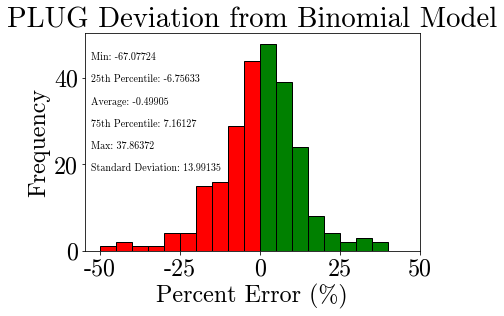

In [99]:
analyze_ev_dev("plug")

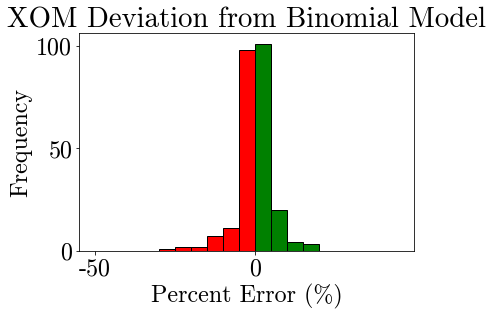

In [83]:
analyze_ev_dev("xom")


The most negative slope for NEE is:
-11.261

The 25th percentile slope for NEE is:
-1.793

The average slope for NEE is:
-0.027

The 75th percentile slope for NEE is:
1.8

The most positive slope for NEE is:
13.851

The standard deviation of the slopes for NEE is:
3.348


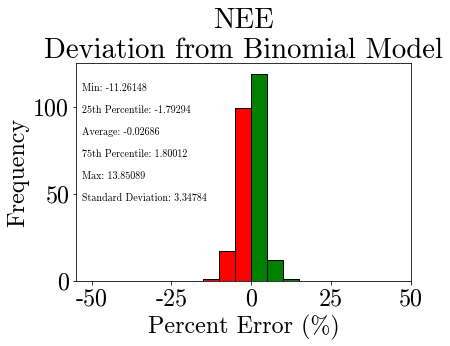





The most negative slope for TSLA is:
-117.766

The 25th percentile slope for TSLA is:
-6.412

The average slope for TSLA is:
-1.035

The 75th percentile slope for TSLA is:
6.451

The most positive slope for TSLA is:
39.799

The standard deviation of the slopes for TSLA is:
14.423


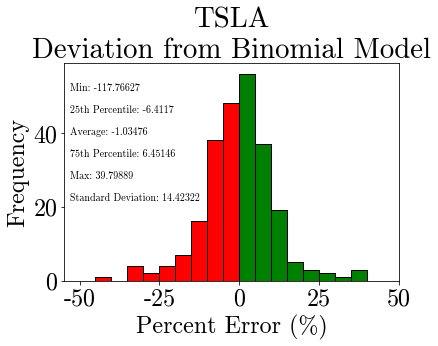





The most negative slope for FSLR is:
-32.088

The 25th percentile slope for FSLR is:
-5.08

The average slope for FSLR is:
0.017

The 75th percentile slope for FSLR is:
6.072

The most positive slope for FSLR is:
22.797

The standard deviation of the slopes for FSLR is:
8.665


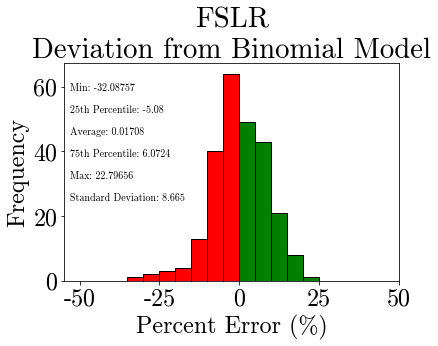





The most negative slope for RUN is:
-101.975

The 25th percentile slope for RUN is:
-6.468

The average slope for RUN is:
-0.689

The 75th percentile slope for RUN is:
6.89

The most positive slope for RUN is:
40.28

The standard deviation of the slopes for RUN is:
13.54


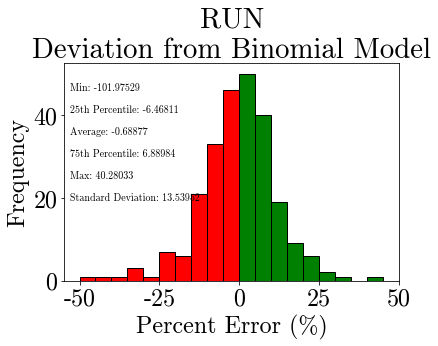





The most negative slope for CWEN is:
-22.37

The 25th percentile slope for CWEN is:
-3.417

The average slope for CWEN is:
-0.124

The 75th percentile slope for CWEN is:
3.188

The most positive slope for CWEN is:
19.258

The standard deviation of the slopes for CWEN is:
6.06


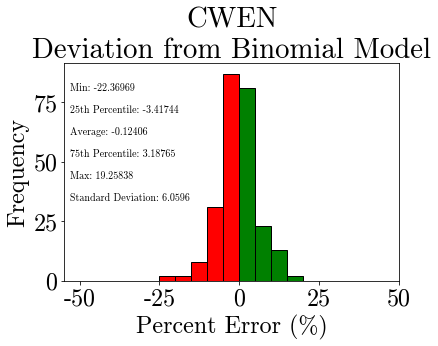





The most negative slope for PLUG is:
-67.077

The 25th percentile slope for PLUG is:
-6.756

The average slope for PLUG is:
-0.499

The 75th percentile slope for PLUG is:
7.161

The most positive slope for PLUG is:
37.864

The standard deviation of the slopes for PLUG is:
13.991


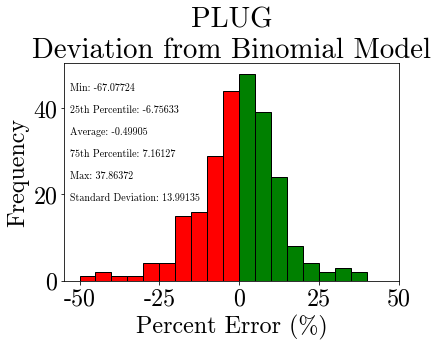





The most negative slope for NEE Pre-March 11, 2020, is:
-7.396

The 25th percentile slope for NEE Pre-March 11, 2020, is:
-1.709

The average slope for NEE Pre-March 11, 2020, is:
-0.154

The 75th percentile slope for NEE Pre-March 11, 2020, is:
1.5

The most positive slope for NEE Pre-March 11, 2020, is:
9.164

The standard deviation of the slopes for NEE Pre-March 11, 2020, is:
2.722


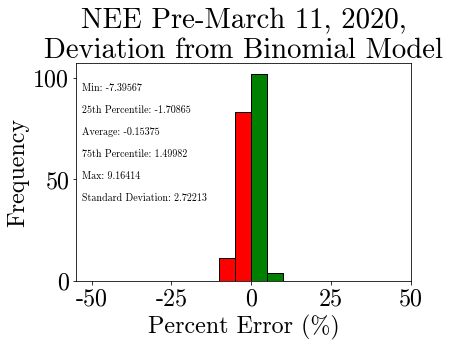





The most negative slope for TSLA Pre-March 11, 2020, is:
-53.303

The 25th percentile slope for TSLA Pre-March 11, 2020, is:
-5.96

The average slope for TSLA Pre-March 11, 2020, is:
-0.683

The 75th percentile slope for TSLA Pre-March 11, 2020, is:
5.253

The most positive slope for TSLA Pre-March 11, 2020, is:
37.122

The standard deviation of the slopes for TSLA Pre-March 11, 2020, is:
10.328


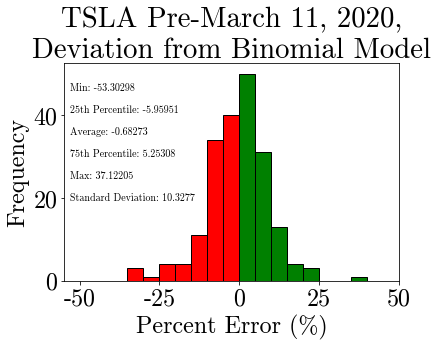





The most negative slope for FSLR Pre-March 11, 2020, is:
-29.203

The 25th percentile slope for FSLR Pre-March 11, 2020, is:
-4.556

The average slope for FSLR Pre-March 11, 2020, is:
-0.034

The 75th percentile slope for FSLR Pre-March 11, 2020, is:
5.355

The most positive slope for FSLR Pre-March 11, 2020, is:
22.797

The standard deviation of the slopes for FSLR Pre-March 11, 2020, is:
7.773


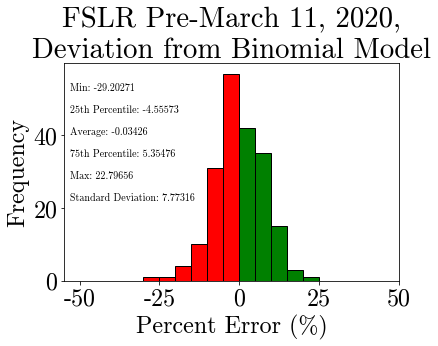





The most negative slope for RUN Pre-March 11, 2020, is:
-32.126

The 25th percentile slope for RUN Pre-March 11, 2020, is:
-5.575

The average slope for RUN Pre-March 11, 2020, is:
-0.32

The 75th percentile slope for RUN Pre-March 11, 2020, is:
5.975

The most positive slope for RUN Pre-March 11, 2020, is:
23.534

The standard deviation of the slopes for RUN Pre-March 11, 2020, is:
9.235


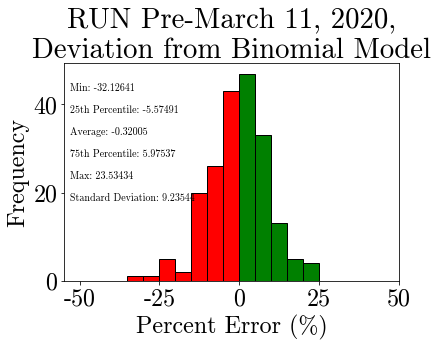





The most negative slope for CWEN Pre-March 11, 2020, is:
-22.37

The 25th percentile slope for CWEN Pre-March 11, 2020, is:
-3.217

The average slope for CWEN Pre-March 11, 2020, is:
-0.228

The 75th percentile slope for CWEN Pre-March 11, 2020, is:
2.954

The most positive slope for CWEN Pre-March 11, 2020, is:
14.096

The standard deviation of the slopes for CWEN Pre-March 11, 2020, is:
5.427


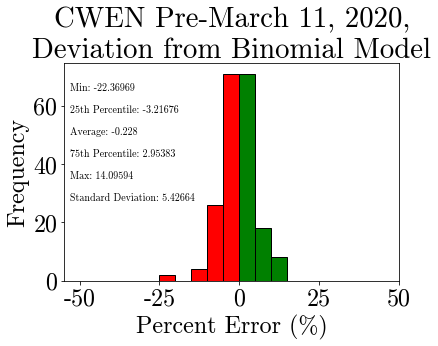





The most negative slope for PLUG Pre-March 11, 2020, is:
-63.76

The 25th percentile slope for PLUG Pre-March 11, 2020, is:
-5.713

The average slope for PLUG Pre-March 11, 2020, is:
-0.507

The 75th percentile slope for PLUG Pre-March 11, 2020, is:
6.003

The most positive slope for PLUG Pre-March 11, 2020, is:
36.789

The standard deviation of the slopes for PLUG Pre-March 11, 2020, is:
11.964


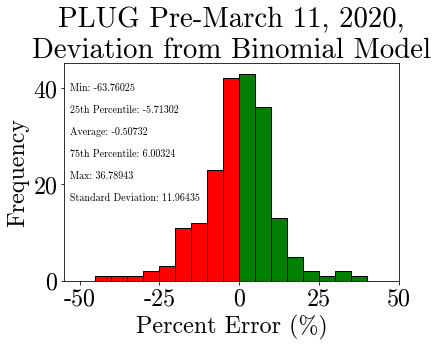





The most negative slope for NEE Post-March 11, 2020, is:
-11.261

The 25th percentile slope for NEE Post-March 11, 2020, is:
-2.17

The average slope for NEE Post-March 11, 2020, is:
0.139

The 75th percentile slope for NEE Post-March 11, 2020, is:
3.529

The most positive slope for NEE Post-March 11, 2020, is:
8.898

The standard deviation of the slopes for NEE Post-March 11, 2020, is:
4.834


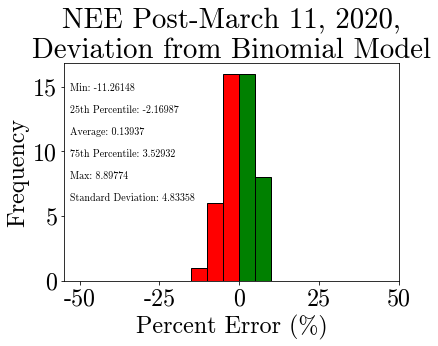





The most negative slope for TSLA Post-March 11, 2020, is:
-117.766

The 25th percentile slope for TSLA Post-March 11, 2020, is:
-10.601

The average slope for TSLA Post-March 11, 2020, is:
-3.587

The 75th percentile slope for TSLA Post-March 11, 2020, is:
8.236

The most positive slope for TSLA Post-March 11, 2020, is:
39.799

The standard deviation of the slopes for TSLA Post-March 11, 2020, is:
24.7


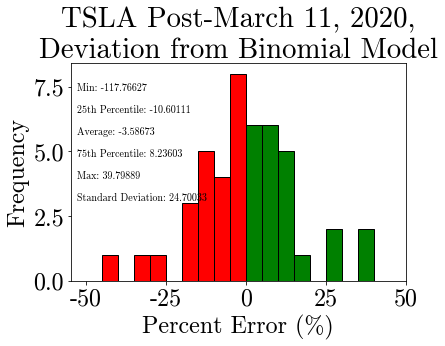





The most negative slope for FSLR Post-March 11, 2020, is:
-32.088

The 25th percentile slope for FSLR Post-March 11, 2020, is:
-6.538

The average slope for FSLR Post-March 11, 2020, is:
-0.306

The 75th percentile slope for FSLR Post-March 11, 2020, is:
7.992

The most positive slope for FSLR Post-March 11, 2020, is:
18.109

The standard deviation of the slopes for FSLR Post-March 11, 2020, is:
11.553


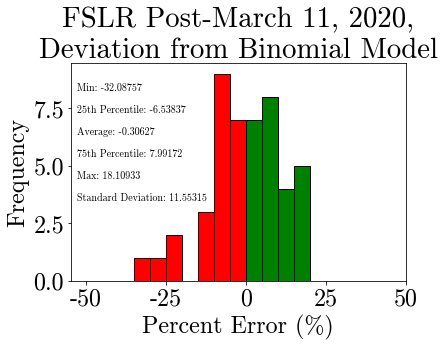





The most negative slope for RUN Post-March 11, 2020, is:
-101.975

The 25th percentile slope for RUN Post-March 11, 2020, is:
-15.925

The average slope for RUN Post-March 11, 2020, is:
-3.349

The 75th percentile slope for RUN Post-March 11, 2020, is:
12.492

The most positive slope for RUN Post-March 11, 2020, is:
40.28

The standard deviation of the slopes for RUN Post-March 11, 2020, is:
23.925


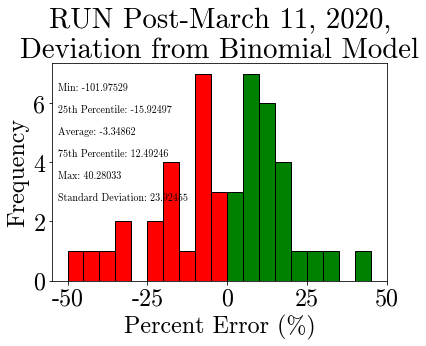





The most negative slope for CWEN Post-March 11, 2020, is:
-16.485

The 25th percentile slope for CWEN Post-March 11, 2020, is:
-4.325

The average slope for CWEN Post-March 11, 2020, is:
-0.139

The 75th percentile slope for CWEN Post-March 11, 2020, is:
4.614

The most positive slope for CWEN Post-March 11, 2020, is:
17.538

The standard deviation of the slopes for CWEN Post-March 11, 2020, is:
7.816


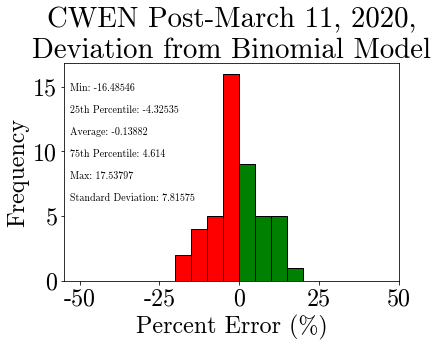





The most negative slope for PLUG Post-March 11, 2020, is:
-67.077

The 25th percentile slope for PLUG Post-March 11, 2020, is:
-11.367

The average slope for PLUG Post-March 11, 2020, is:
-1.168

The 75th percentile slope for PLUG Post-March 11, 2020, is:
13.101

The most positive slope for PLUG Post-March 11, 2020, is:
37.864

The standard deviation of the slopes for PLUG Post-March 11, 2020, is:
20.391


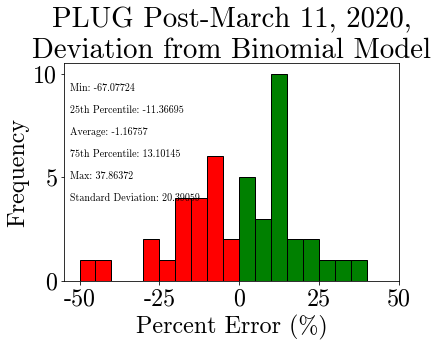

In [145]:
for stock in renewable:
    analyze_ev_dev(stock)
for stock in renewable_pre:
    analyze_ev_dev(stock)
for stock in renewable_post:
    analyze_ev_dev(stock)


The most negative slope for XOM is:
-26.768

The 25th percentile slope for XOM is:
-2.008

The average slope for XOM is:
-0.072

The 75th percentile slope for XOM is:
2.608

The most positive slope for XOM is:
18.978

The standard deviation of the slopes for XOM is:
5.322


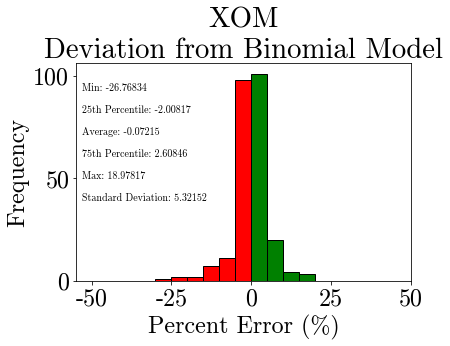





The most negative slope for CVX is:
-44.8

The 25th percentile slope for CVX is:
-2.321

The average slope for CVX is:
-0.05

The 75th percentile slope for CVX is:
2.651

The most positive slope for CVX is:
24.095

The standard deviation of the slopes for CVX is:
5.867


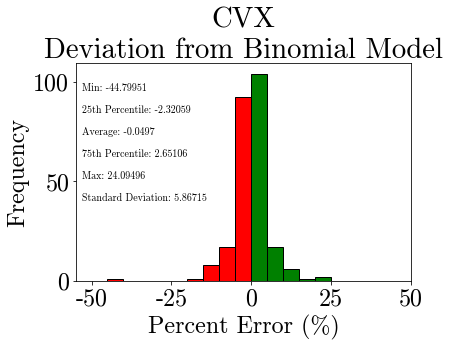





The most negative slope for COP is:
-64.684

The 25th percentile slope for COP is:
-3.777

The average slope for COP is:
-0.224

The 75th percentile slope for COP is:
3.878

The most positive slope for COP is:
31.186

The standard deviation of the slopes for COP is:
8.484


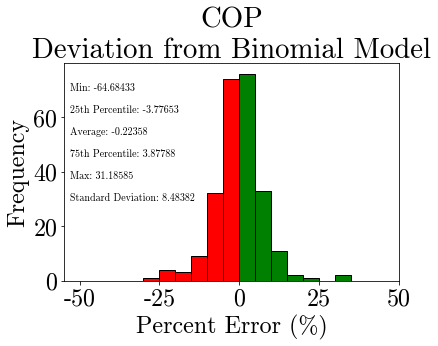





The most negative slope for BTU is:
-147.671

The 25th percentile slope for BTU is:
-6.339

The average slope for BTU is:
-1.778

The 75th percentile slope for BTU is:
7.046

The most positive slope for BTU is:
53.387

The standard deviation of the slopes for BTU is:
20.923


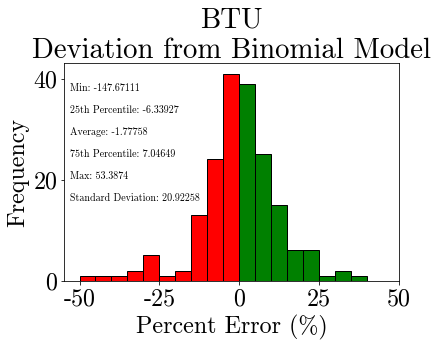





The most negative slope for ARCH is:
-41.634

The 25th percentile slope for ARCH is:
-4.836

The average slope for ARCH is:
-0.281

The 75th percentile slope for ARCH is:
4.466

The most positive slope for ARCH is:
32.237

The standard deviation of the slopes for ARCH is:
9.657


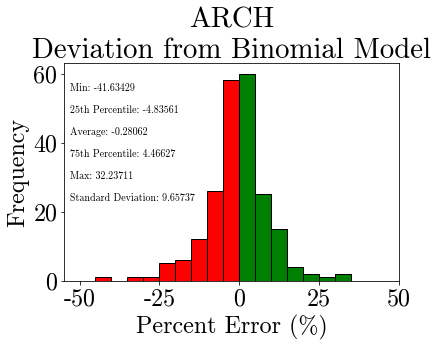





The most negative slope for XOM Pre-March 11, 2020, is:
-11.64

The 25th percentile slope for XOM Pre-March 11, 2020, is:
-1.649

The average slope for XOM Pre-March 11, 2020, is:
0.056

The 75th percentile slope for XOM Pre-March 11, 2020, is:
2.073

The most positive slope for XOM Pre-March 11, 2020, is:
11.21

The standard deviation of the slopes for XOM Pre-March 11, 2020, is:
3.398


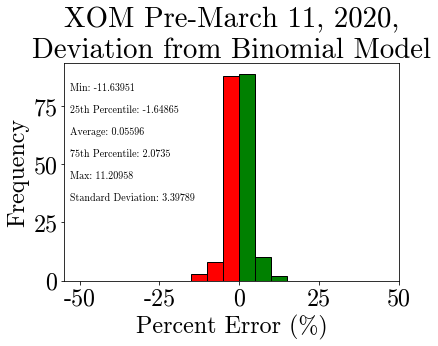





The most negative slope for CVX Pre-March 11, 2020, is:
-13.196

The 25th percentile slope for CVX Pre-March 11, 2020, is:
-2.131

The average slope for CVX Pre-March 11, 2020, is:
0.003

The 75th percentile slope for CVX Pre-March 11, 2020, is:
2.043

The most positive slope for CVX Pre-March 11, 2020, is:
11.727

The standard deviation of the slopes for CVX Pre-March 11, 2020, is:
3.598


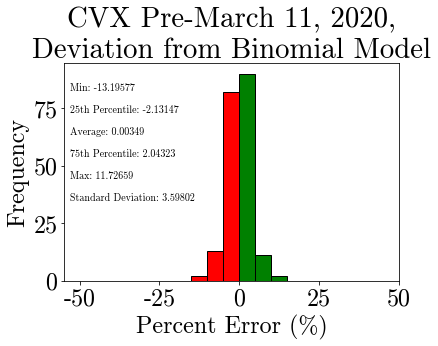





The most negative slope for COP Pre-March 11, 2020, is:
-16.143

The 25th percentile slope for COP Pre-March 11, 2020, is:
-3.348

The average slope for COP Pre-March 11, 2020, is:
-0.058

The 75th percentile slope for COP Pre-March 11, 2020, is:
3.407

The most positive slope for COP Pre-March 11, 2020, is:
14.771

The standard deviation of the slopes for COP Pre-March 11, 2020, is:
5.229


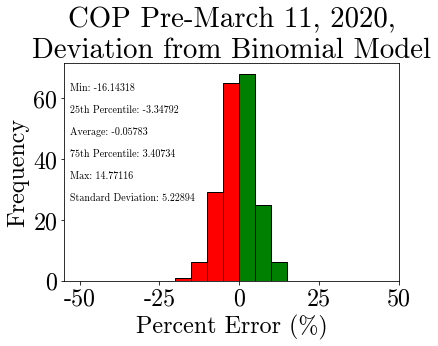





The most negative slope for BTU Pre-March 11, 2020, is:
-53.305

The 25th percentile slope for BTU Pre-March 11, 2020, is:
-4.387

The average slope for BTU Pre-March 11, 2020, is:
0.003

The 75th percentile slope for BTU Pre-March 11, 2020, is:
5.044

The most positive slope for BTU Pre-March 11, 2020, is:
34.179

The standard deviation of the slopes for BTU Pre-March 11, 2020, is:
9.87


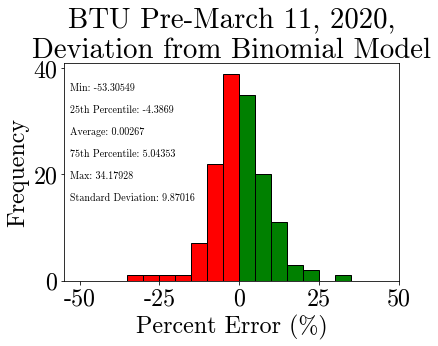





The most negative slope for ARCH Pre-March 11, 2020, is:
-34.279

The 25th percentile slope for ARCH Pre-March 11, 2020, is:
-4.251

The average slope for ARCH Pre-March 11, 2020, is:
-0.039

The 75th percentile slope for ARCH Pre-March 11, 2020, is:
4.372

The most positive slope for ARCH Pre-March 11, 2020, is:
32.237

The standard deviation of the slopes for ARCH Pre-March 11, 2020, is:
7.892


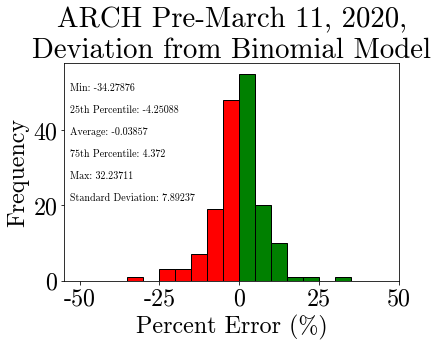





The most negative slope for XOM Post-March 11, 2020, is:
-26.768

The 25th percentile slope for XOM Post-March 11, 2020, is:
-5.92

The average slope for XOM Post-March 11, 2020, is:
-1.11

The 75th percentile slope for XOM Post-March 11, 2020, is:
5.043

The most positive slope for XOM Post-March 11, 2020, is:
18.978

The standard deviation of the slopes for XOM Post-March 11, 2020, is:
9.615


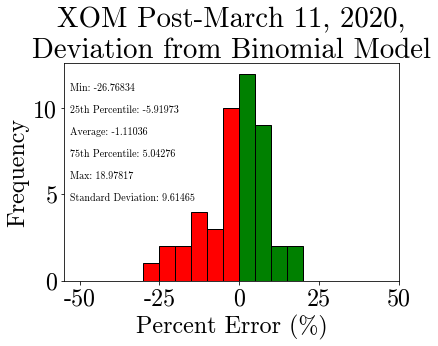





The most negative slope for CVX Post-March 11, 2020, is:
-44.8

The 25th percentile slope for CVX Post-March 11, 2020, is:
-5.117

The average slope for CVX Post-March 11, 2020, is:
-1.059

The 75th percentile slope for CVX Post-March 11, 2020, is:
4.74

The most positive slope for CVX Post-March 11, 2020, is:
21.523

The standard deviation of the slopes for CVX Post-March 11, 2020, is:
10.509


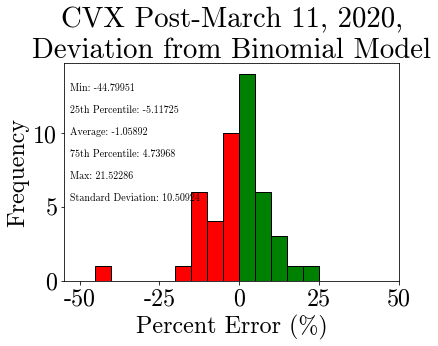





The most negative slope for COP Post-March 11, 2020, is:
-64.684

The 25th percentile slope for COP Post-March 11, 2020, is:
-7.544

The average slope for COP Post-March 11, 2020, is:
-1.665

The 75th percentile slope for COP Post-March 11, 2020, is:
8.552

The most positive slope for COP Post-March 11, 2020, is:
31.186

The standard deviation of the slopes for COP Post-March 11, 2020, is:
15.579


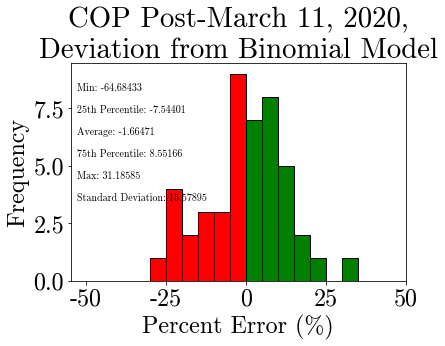





The most negative slope for BTU Post-March 11, 2020, is:
-65.736

The 25th percentile slope for BTU Post-March 11, 2020, is:
-11.204

The average slope for BTU Post-March 11, 2020, is:
-0.128

The 75th percentile slope for BTU Post-March 11, 2020, is:
14.19

The most positive slope for BTU Post-March 11, 2020, is:
51.659

The standard deviation of the slopes for BTU Post-March 11, 2020, is:
23.824


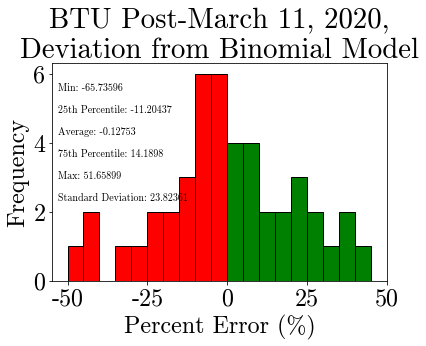





The most negative slope for ARCH Post-March 11, 2020, is:
-25.577

The 25th percentile slope for ARCH Post-March 11, 2020, is:
-7.292

The average slope for ARCH Post-March 11, 2020, is:
0.056

The 75th percentile slope for ARCH Post-March 11, 2020, is:
8.328

The most positive slope for ARCH Post-March 11, 2020, is:
25.402

The standard deviation of the slopes for ARCH Post-March 11, 2020, is:
11.192


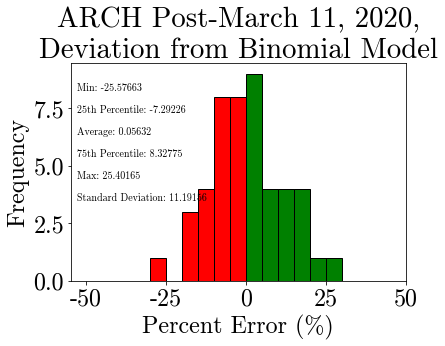

In [146]:
for stock in fossil:
    analyze_ev_dev(stock)
for stock in fossil_pre:
    analyze_ev_dev(stock)
for stock in fossil_post:
    analyze_ev_dev(stock)

In [147]:
def analyze_group_ev_dev(plot_name,tickers_list):
    performance = []
    for ticker in tickers_list:
        stock_data = pd.read_csv("./data_to_Mar_6/"+ticker+".csv")
        close_prices = stock_data['Close'].values.tolist()
        possible_q = np.arange(0.01,0.99,step=0.01)
        for week in range(int(len(close_prices)/5)-2):    
            first_day_of_range = 5 * week
            last_day_of_range = 5 * week + 10
            q_errors = []
            for q in possible_q:
                test = error_fun(q,ticker,close_prices[first_day_of_range:last_day_of_range])
                q_errors.append([q,test])
            optimal_q = min(q_errors, key = lambda t: t[1])
            m,ev4 = slope(optimal_q[0],ticker,close_prices[first_day_of_range:last_day_of_range])
            weekly_performance = (close_prices[last_day_of_range] - ev4)/ev4*100
            performance.append(weekly_performance)

    avg_m = np.mean(performance)
    max_m = max(performance)
    min_m = min(performance)
    seventyfifth_per = np.percentile(performance,75)
    twentyfifth_per = np.percentile(performance,25)
    std_m = np.std(performance)
    # overperform_percent = np.mean(overperform) * 100

    print("\nThe most negative slope for " + plot_name + " is:")
    print(round(min_m,3))

    print("\nThe 25th percentile slope for " + plot_name + " is:")
    print(round(twentyfifth_per,3))

    print("\nThe average slope for " + plot_name + " is:")
    print(round(avg_m,3))

    print("\nThe 75th percentile slope for " + plot_name + " is:")
    print(round(seventyfifth_per,3))

    print("\nThe most positive slope for " + plot_name + " is:")
    print(round(max_m,3))

    print("\nThe standard deviation of the slopes for " + plot_name + " is:")
    print(round(std_m,3))

    max_p = max(performance)
    min_p = min(performance)
    n, bins, patches = plt.hist(performance, 
    bins=np.arange(-50,50,5),
    edgecolor="black", 
    color='green')

    for i in range(len(bins)):
        if bins[i] < -0.0001:
            plt.setp(patches[i], 'facecolor', 'r')

    max_n = max(n)

    plt.annotate('Min: ' + str(round(min_m,5)) +
                '\n\n25th Percentile: ' + str(round(twentyfifth_per,5)) +
                '\n\nAverage: ' + str(round(avg_m,5)) +
                '\n\n75th Percentile: ' + str(round(seventyfifth_per,5)) +
                '\n\nMax: ' + str(round(max_m,5))+
                '\n\nStandard Deviation: ' + str(round(std_m,5)), # this is the text
        (-53, 2/3 * max_n), # this is the point to label
        va='center',
        ha='left',
        c='black',
        fontname='cmr10',
        fontsize=10)

    plt.xlabel("Percent Error (%)")
    plt.ylabel("Frequency")
    plt.xticks(np.arange(-50, 55, step=25))
    plt.title(plot_name + "\nDeviation from Binomial Model")
    plt.show()

    print("\n\n")


The most negative slope for Renewable Group is:
-40.28

The 25th percentile slope for Renewable Group is:
-4.721

The average slope for Renewable Group is:
0.393

The 75th percentile slope for Renewable Group is:
4.421

The most positive slope for Renewable Group is:
117.766

The standard deviation of the slopes for Renewable Group is:
10.886


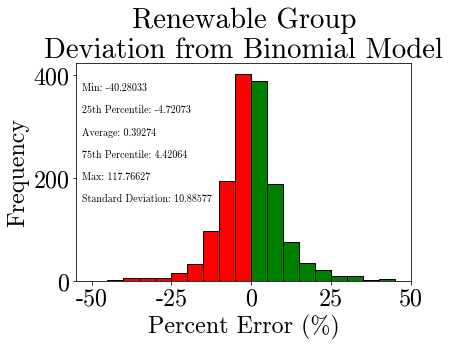





The most negative slope for Fossil Group is:
-53.387

The 25th percentile slope for Fossil Group is:
-3.581

The average slope for Fossil Group is:
0.426

The 75th percentile slope for Fossil Group is:
3.297

The most positive slope for Fossil Group is:
147.671

The standard deviation of the slopes for Fossil Group is:
10.972


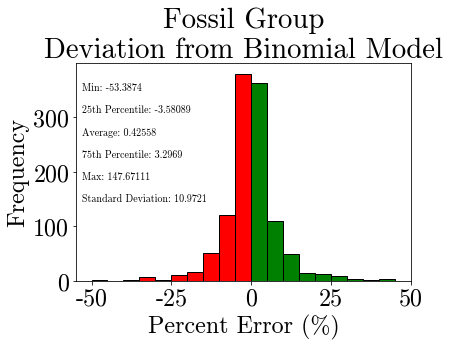





The most negative slope for Market Indices is:
-14.11

The 25th percentile slope for Market Indices is:
-1.782

The average slope for Market Indices is:
0.162

The 75th percentile slope for Market Indices is:
1.695

The most positive slope for Market Indices is:
48.988

The standard deviation of the slopes for Market Indices is:
3.848


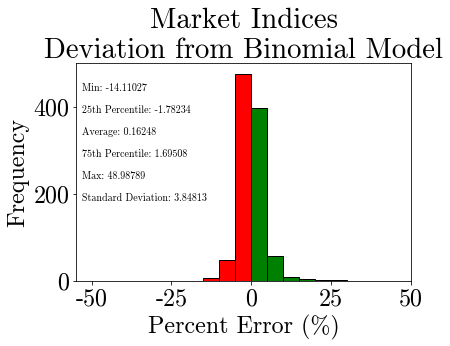

In [149]:
analyze_group_ev_dev("Renewable Group",renewable)
analyze_group_ev_dev("Fossil Group",fossil)
analyze_group_ev_dev("Market Indices",market)

In [120]:
    performance1 = []
    for ticker in renewable:
        stock_data = pd.read_csv("./data_to_Mar_6/"+ticker+".csv")
        close_prices = stock_data['Close'].values.tolist()
        possible_q = np.arange(0.01,0.99,step=0.01)
        for week in range(int(len(close_prices)/5)-2):    
            first_day_of_range = 5 * week
            last_day_of_range = 5 * week + 10
            q_errors = []
            for q in possible_q:
                test = error_fun(q,ticker,close_prices[first_day_of_range:last_day_of_range])
                q_errors.append([q,test])
            optimal_q = min(q_errors, key = lambda t: t[1])
            m,ev4 = slope(optimal_q[0],ticker,close_prices[first_day_of_range:last_day_of_range])
            weekly_performance = (close_prices[last_day_of_range] - ev4)/ev4*100
            performance1.append(weekly_performance)

    avg_1 = np.mean(performance1)
    std_1 = np.std(performance1)
    N1 = len(performance1)
    

    performance2 = []
    for ticker in fossil:
        stock_data = pd.read_csv("./data_to_Mar_6/"+ticker+".csv")
        close_prices = stock_data['Close'].values.tolist()
        possible_q = np.arange(0.01,0.99,step=0.01)
        for week in range(int(len(close_prices)/5)-2):    
            first_day_of_range = 5 * week
            last_day_of_range = 5 * week + 10
            q_errors = []
            for q in possible_q:
                test = error_fun(q,ticker,close_prices[first_day_of_range:last_day_of_range])
                q_errors.append([q,test])
            optimal_q = min(q_errors, key = lambda t: t[1])
            m,ev4 = slope(optimal_q[0],ticker,close_prices[first_day_of_range:last_day_of_range])
            weekly_performance = (close_prices[last_day_of_range] - ev4)/ev4*100
            performance2.append(weekly_performance)

    avg_2 = np.mean(performance2)
    std_2 = np.std(performance2)
    N2 = len(performance2)

    std_error = np.sqrt((std_1/N1)+(std_2/N2))

    t_score = np.abs(avg_1-avg_2)/std_error
    deg_free = N1 + N2 - 2

    print("T-score: " + str(t_score))
    print("Degrees of Freedom: " + str(deg_free))

    
    print("\n\n")

T-score: 0.2538537262782588
Degrees of Freedom: 2653



